In [0]:
# # %tensorflow_version only exists in Colab.
%tensorflow_version 2.x

TensorFlow 2.x selected.


# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![GAN examples](https://drive.google.com/uc?id=1UP1VpQ8w-VjT9mckx_aRXMvZrQoy6zpN)


## Setup

In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

DRIVE_DIR = '/content/drive/My Drive/uu_deep_learning_data/gan'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load(os.path.join(DRIVE_DIR, 'gan-checks-tf.npz'))

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 0s 0us/step


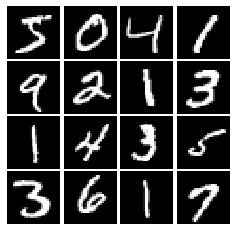

In [0]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [0]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    #tf.print(x)
    x_in=x
    x_out=tf.maximum(x_in*alpha,x)
    pass 

    return x_out

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [0]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [0]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    shape=[batch_size,dim]
    t_out=tf.random.uniform(shape,minval = -1,maxval = 1)
    pass
    return t_out

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [0]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [0]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [0]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    pass
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [0]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [0]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [0]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [0]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.222, G:0.693
Instructions for updating:
Use tf.identity instead.


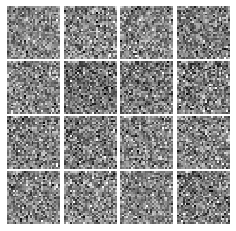

Epoch: 0, Iter: 20, D: 0.5764, G:0.9393


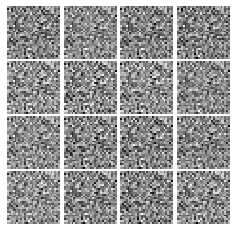

Epoch: 0, Iter: 40, D: 0.3936, G:1.228


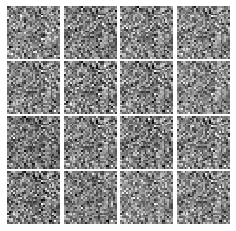

Epoch: 0, Iter: 60, D: 0.0954, G:3.133


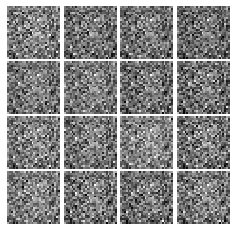

Epoch: 0, Iter: 80, D: 1.229, G:2.96


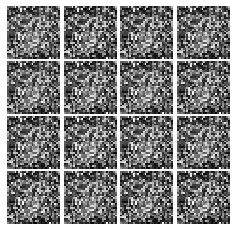

Epoch: 0, Iter: 100, D: 0.3912, G:2.012


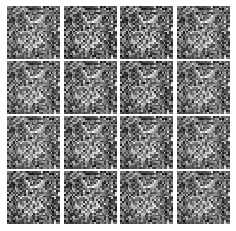

Epoch: 0, Iter: 120, D: 1.748, G:0.83


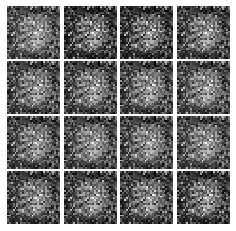

Epoch: 0, Iter: 140, D: 1.083, G:1.319


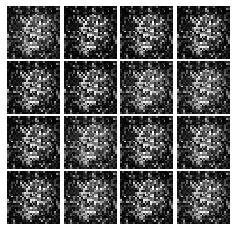

Epoch: 0, Iter: 160, D: 1.099, G:2.049


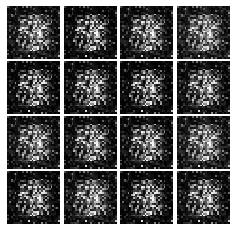

Epoch: 0, Iter: 180, D: 1.297, G:0.9623


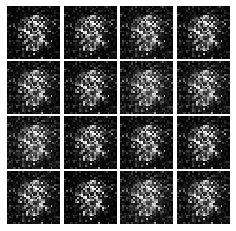

Epoch: 0, Iter: 200, D: 1.384, G:1.176


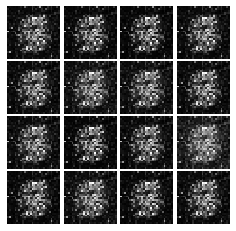

Epoch: 0, Iter: 220, D: 1.353, G:1.216


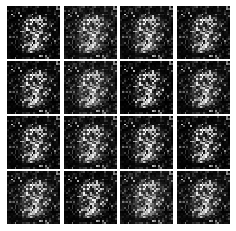

Epoch: 0, Iter: 240, D: 0.9378, G:1.315


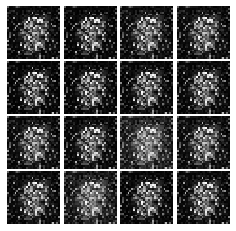

Epoch: 0, Iter: 260, D: 1.223, G:1.366


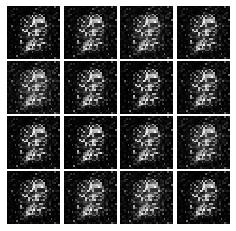

Epoch: 0, Iter: 280, D: 1.257, G:1.329


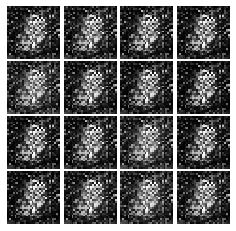

Epoch: 0, Iter: 300, D: 1.912, G:0.8763


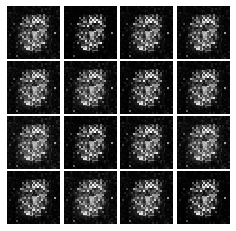

Epoch: 0, Iter: 320, D: 1.368, G:1.419


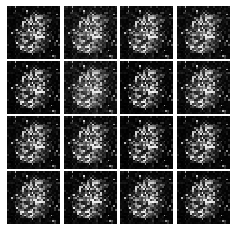

Epoch: 0, Iter: 340, D: 2.035, G:1.049


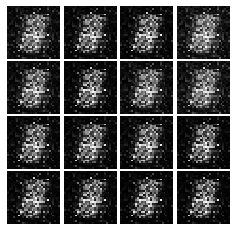

Epoch: 0, Iter: 360, D: 1.302, G:0.9583


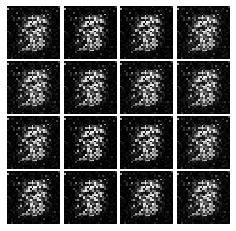

Epoch: 0, Iter: 380, D: 0.9539, G:1.257


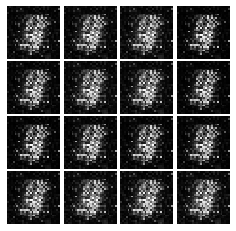

Epoch: 0, Iter: 400, D: 0.7919, G:1.525


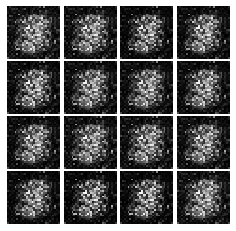

Epoch: 0, Iter: 420, D: 1.096, G:2.011


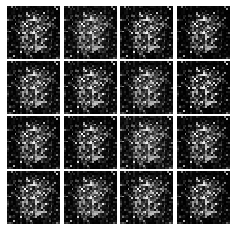

Epoch: 0, Iter: 440, D: 1.39, G:2.98


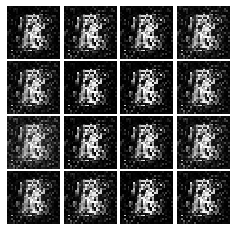

Epoch: 0, Iter: 460, D: 1.732, G:0.7585


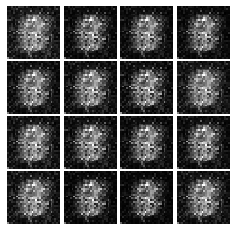

Epoch: 1, Iter: 480, D: 1.137, G:1.474


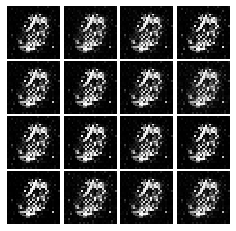

Epoch: 1, Iter: 500, D: 1.345, G:2.137


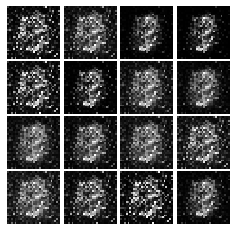

Epoch: 1, Iter: 520, D: 1.034, G:2.717


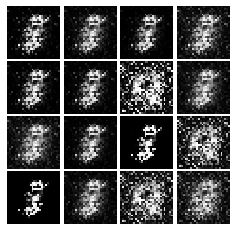

Epoch: 1, Iter: 540, D: 1.452, G:0.94


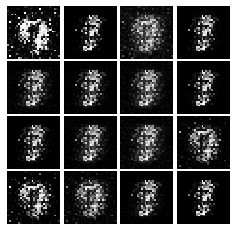

Epoch: 1, Iter: 560, D: 1.021, G:1.291


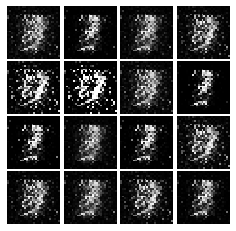

Epoch: 1, Iter: 580, D: 1.304, G:0.8021


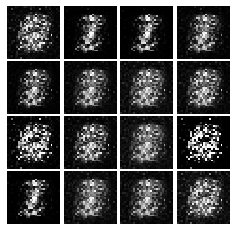

Epoch: 1, Iter: 600, D: 1.092, G:1.422


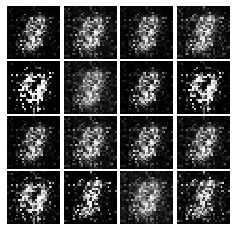

Epoch: 1, Iter: 620, D: 3.605, G:0.06642


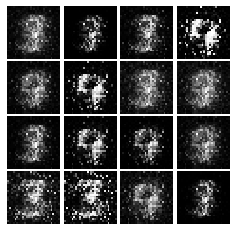

Epoch: 1, Iter: 640, D: 0.9044, G:2.225


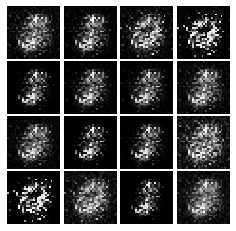

Epoch: 1, Iter: 660, D: 1.159, G:1.317


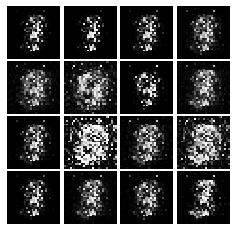

Epoch: 1, Iter: 680, D: 1.052, G:1.196


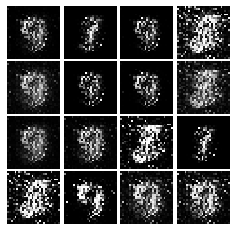

Epoch: 1, Iter: 700, D: 1.474, G:1.543


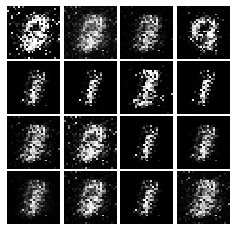

Epoch: 1, Iter: 720, D: 0.9562, G:1.525


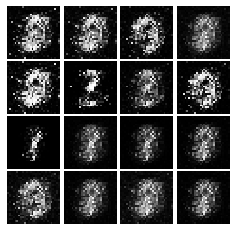

Epoch: 1, Iter: 740, D: 1.148, G:0.9908


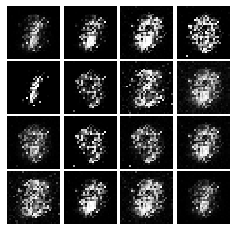

Epoch: 1, Iter: 760, D: 1.319, G:1.292


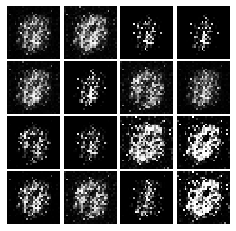

Epoch: 1, Iter: 780, D: 1.435, G:1.002


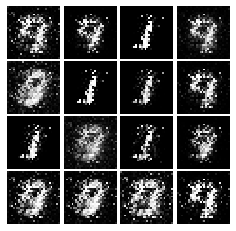

Epoch: 1, Iter: 800, D: 1.321, G:1.029


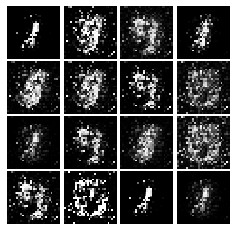

Epoch: 1, Iter: 820, D: 1.799, G:1.24


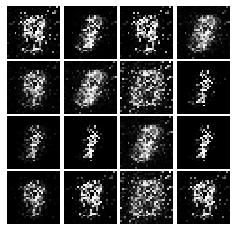

Epoch: 1, Iter: 840, D: 1.532, G:0.3026


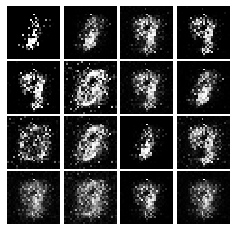

Epoch: 1, Iter: 860, D: 1.717, G:0.8865


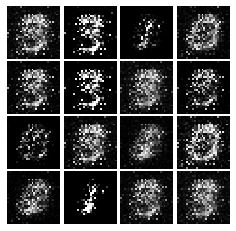

Epoch: 1, Iter: 880, D: 0.9973, G:1.439


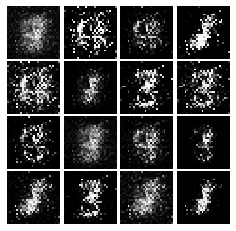

Epoch: 1, Iter: 900, D: 1.164, G:1.301


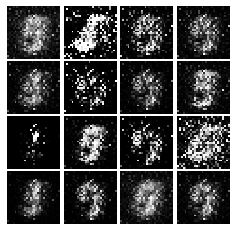

Epoch: 1, Iter: 920, D: 1.234, G:1.306


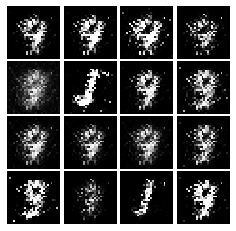

Epoch: 2, Iter: 940, D: 1.402, G:0.9655


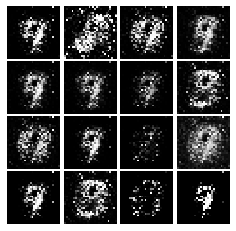

Epoch: 2, Iter: 960, D: 1.051, G:1.163


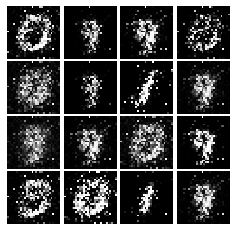

Epoch: 2, Iter: 980, D: 1.103, G:1.483


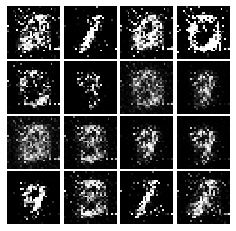

Epoch: 2, Iter: 1000, D: 1.094, G:1.008


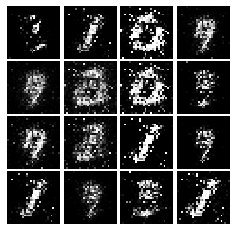

Epoch: 2, Iter: 1020, D: 1.228, G:1.398


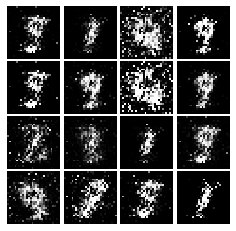

Epoch: 2, Iter: 1040, D: 1.226, G:1.216


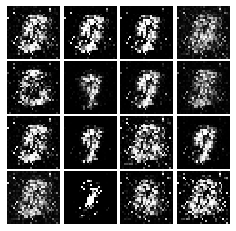

Epoch: 2, Iter: 1060, D: 1.186, G:1.095


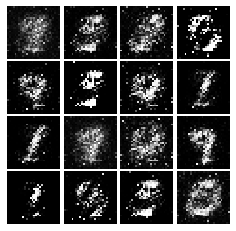

Epoch: 2, Iter: 1080, D: 1.258, G:1.065


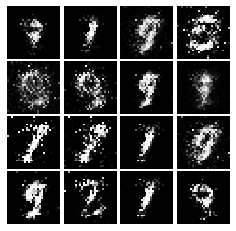

Epoch: 2, Iter: 1100, D: 1.276, G:0.9347


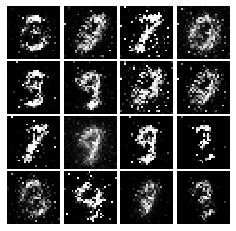

Epoch: 2, Iter: 1120, D: 1.283, G:0.9541


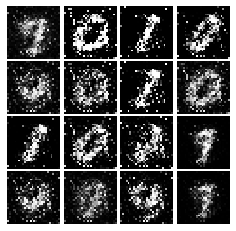

Epoch: 2, Iter: 1140, D: 1.339, G:0.8144


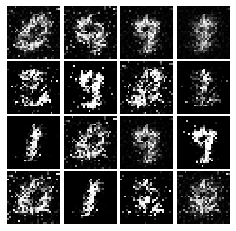

Epoch: 2, Iter: 1160, D: 1.2, G:0.5856


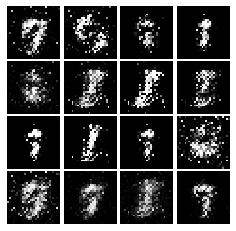

Epoch: 2, Iter: 1180, D: 1.113, G:1.344


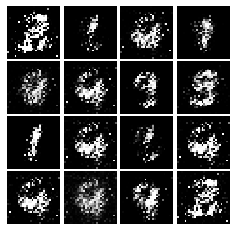

Epoch: 2, Iter: 1200, D: 1.303, G:0.3155


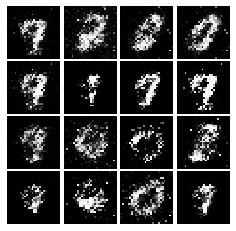

Epoch: 2, Iter: 1220, D: 1.087, G:0.8552


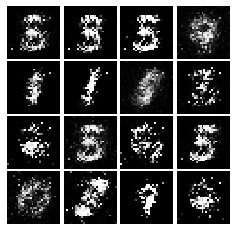

Epoch: 2, Iter: 1240, D: 1.122, G:0.57


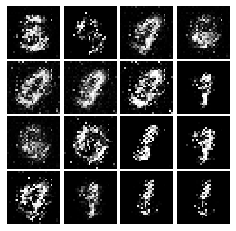

Epoch: 2, Iter: 1260, D: 1.181, G:1.939


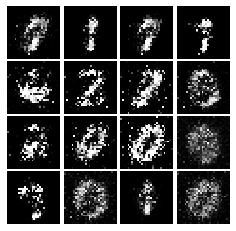

Epoch: 2, Iter: 1280, D: 1.359, G:0.8743


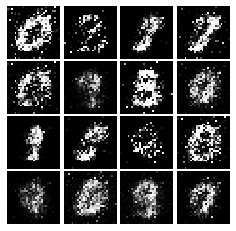

Epoch: 2, Iter: 1300, D: 1.37, G:0.9921


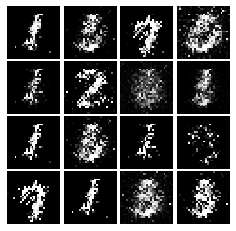

Epoch: 2, Iter: 1320, D: 1.589, G:0.6311


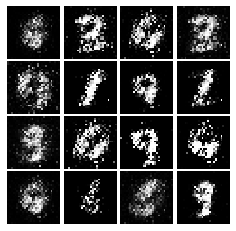

Epoch: 2, Iter: 1340, D: 1.264, G:1.394


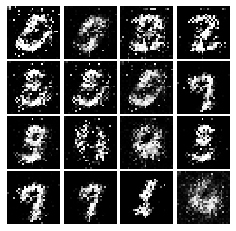

Epoch: 2, Iter: 1360, D: 1.322, G:1.059


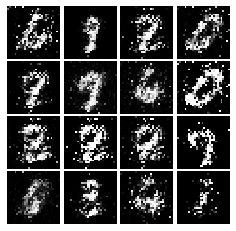

Epoch: 2, Iter: 1380, D: 1.024, G:0.8538


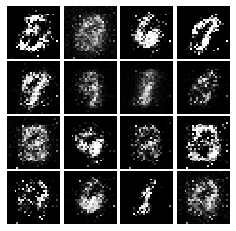

Epoch: 2, Iter: 1400, D: 1.216, G:1.277


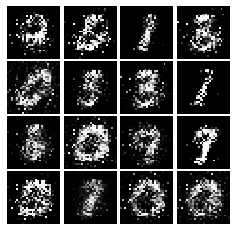

Epoch: 3, Iter: 1420, D: 1.227, G:1.23


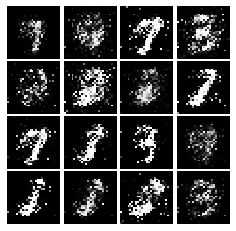

Epoch: 3, Iter: 1440, D: 1.126, G:1.353


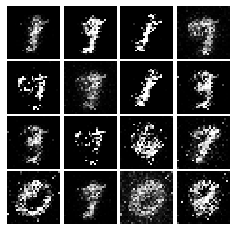

Epoch: 3, Iter: 1460, D: 1.228, G:0.9863


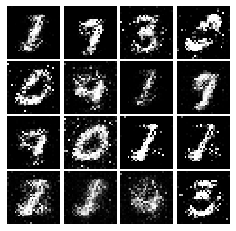

Epoch: 3, Iter: 1480, D: 1.375, G:1.075


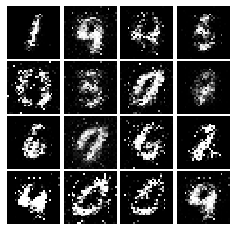

Epoch: 3, Iter: 1500, D: 1.222, G:0.8091


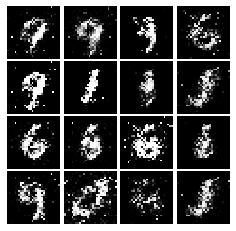

Epoch: 3, Iter: 1520, D: 1.249, G:0.9872


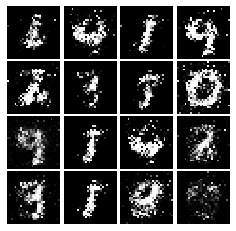

Epoch: 3, Iter: 1540, D: 1.349, G:0.8937


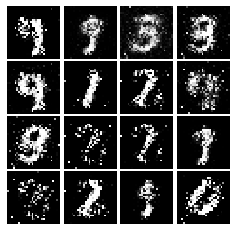

Epoch: 3, Iter: 1560, D: 1.324, G:0.8757


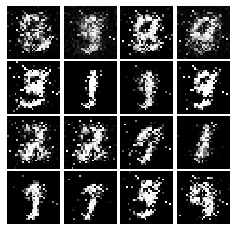

Epoch: 3, Iter: 1580, D: 1.503, G:1.192


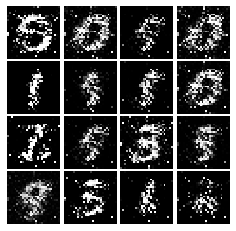

Epoch: 3, Iter: 1600, D: 1.19, G:1.252


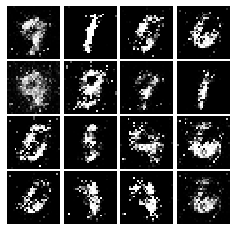

Epoch: 3, Iter: 1620, D: 1.157, G:1.007


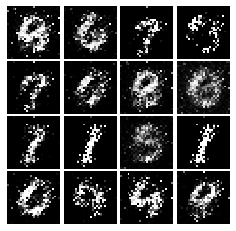

Epoch: 3, Iter: 1640, D: 1.199, G:0.355


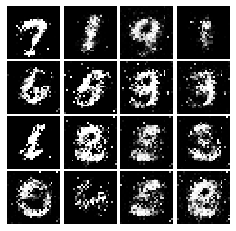

Epoch: 3, Iter: 1660, D: 1.094, G:1.259


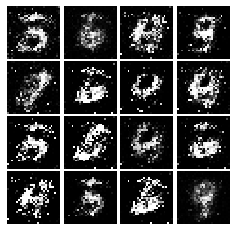

Epoch: 3, Iter: 1680, D: 1.308, G:1.219


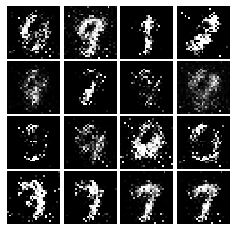

Epoch: 3, Iter: 1700, D: 1.365, G:1.001


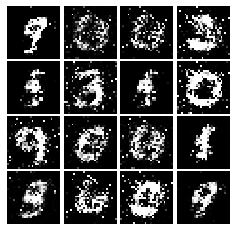

Epoch: 3, Iter: 1720, D: 1.112, G:1.028


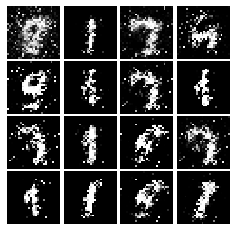

Epoch: 3, Iter: 1740, D: 1.268, G:1.082


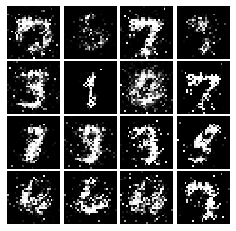

Epoch: 3, Iter: 1760, D: 1.208, G:1.128


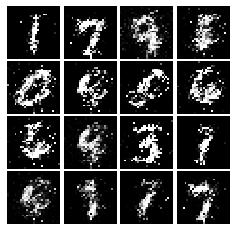

Epoch: 3, Iter: 1780, D: 1.11, G:1.056


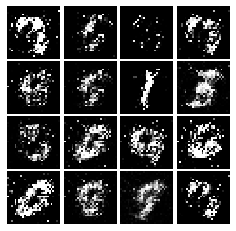

Epoch: 3, Iter: 1800, D: 1.786, G:0.9353


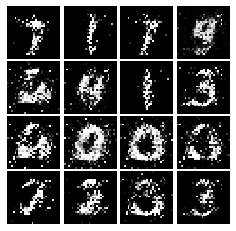

Epoch: 3, Iter: 1820, D: 1.143, G:1.241


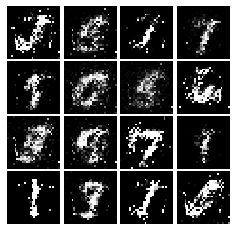

Epoch: 3, Iter: 1840, D: 1.229, G:0.9168


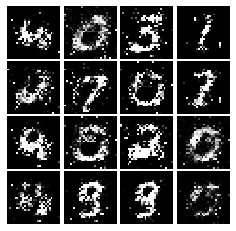

Epoch: 3, Iter: 1860, D: 1.302, G:1.042


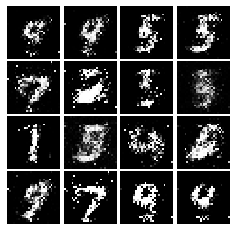

Epoch: 4, Iter: 1880, D: 1.237, G:1.06


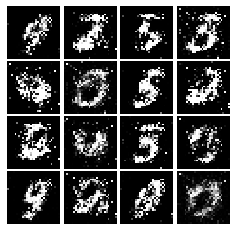

Epoch: 4, Iter: 1900, D: 1.278, G:0.9021


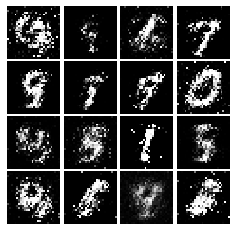

Epoch: 4, Iter: 1920, D: 1.359, G:0.9688


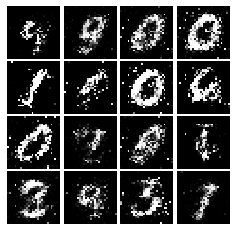

Epoch: 4, Iter: 1940, D: 1.192, G:0.9509


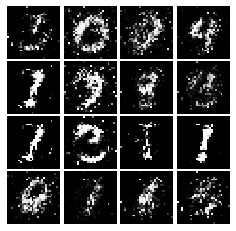

Epoch: 4, Iter: 1960, D: 1.335, G:0.7873


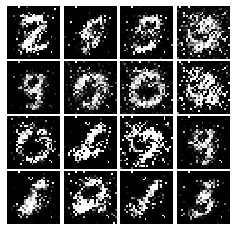

Epoch: 4, Iter: 1980, D: 1.344, G:0.4556


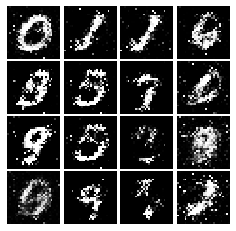

Epoch: 4, Iter: 2000, D: 1.252, G:0.8294


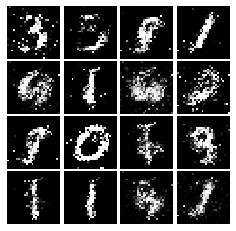

Epoch: 4, Iter: 2020, D: 1.259, G:0.9075


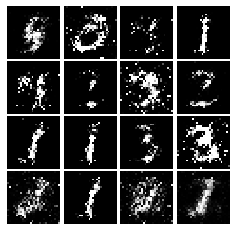

Epoch: 4, Iter: 2040, D: 1.229, G:0.9158


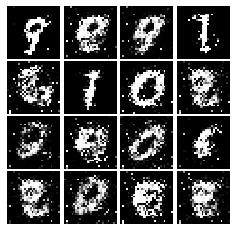

Epoch: 4, Iter: 2060, D: 1.2, G:0.9668


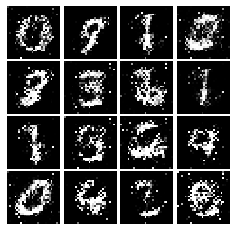

Epoch: 4, Iter: 2080, D: 1.254, G:0.9785


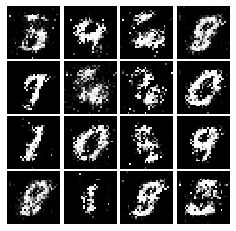

Epoch: 4, Iter: 2100, D: 1.304, G:0.9019


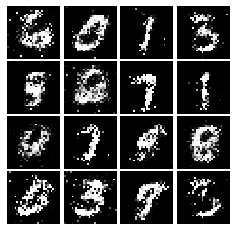

Epoch: 4, Iter: 2120, D: 1.526, G:0.697


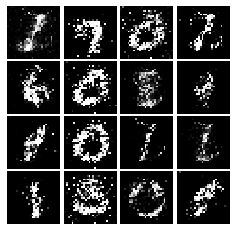

Epoch: 4, Iter: 2140, D: 1.309, G:0.9162


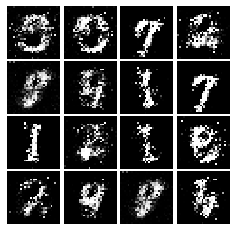

Epoch: 4, Iter: 2160, D: 1.342, G:0.8862


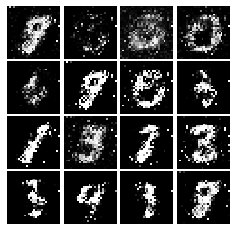

Epoch: 4, Iter: 2180, D: 1.366, G:0.913


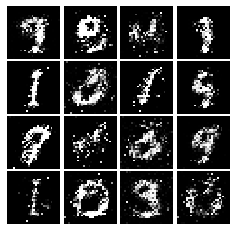

Epoch: 4, Iter: 2200, D: 1.317, G:0.8749


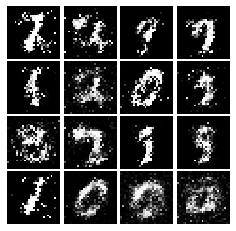

Epoch: 4, Iter: 2220, D: 1.258, G:0.879


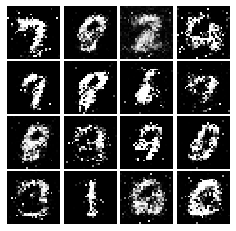

Epoch: 4, Iter: 2240, D: 1.472, G:1.137


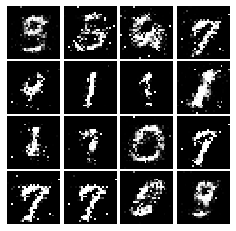

Epoch: 4, Iter: 2260, D: 1.281, G:0.9857


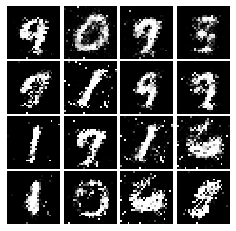

Epoch: 4, Iter: 2280, D: 1.221, G:0.9657


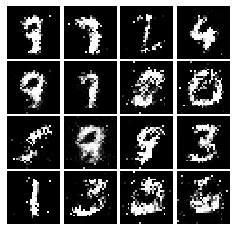

Epoch: 4, Iter: 2300, D: 1.25, G:0.9389


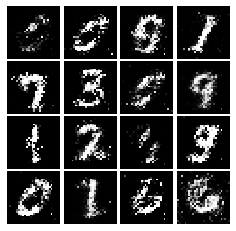

Epoch: 4, Iter: 2320, D: 1.228, G:0.9378


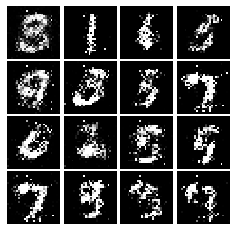

Epoch: 4, Iter: 2340, D: 1.338, G:0.9864


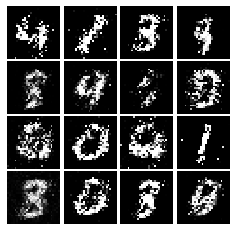

Epoch: 5, Iter: 2360, D: 1.263, G:0.9873


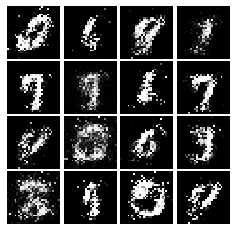

Epoch: 5, Iter: 2380, D: 1.303, G:0.8973


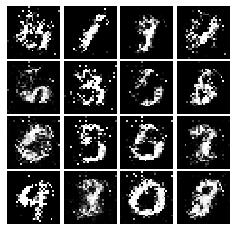

Epoch: 5, Iter: 2400, D: 1.302, G:0.8661


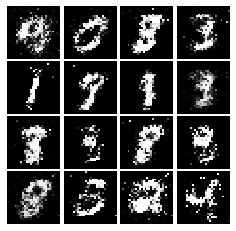

Epoch: 5, Iter: 2420, D: 1.246, G:0.9517


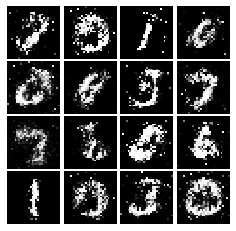

Epoch: 5, Iter: 2440, D: 1.426, G:0.8174


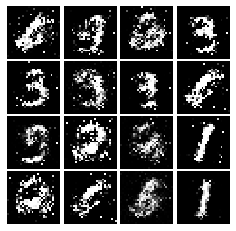

Epoch: 5, Iter: 2460, D: 1.225, G:0.9507


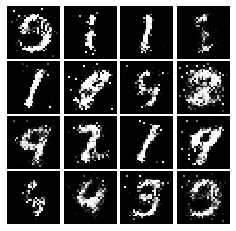

Epoch: 5, Iter: 2480, D: 1.263, G:0.8285


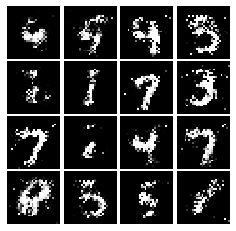

Epoch: 5, Iter: 2500, D: 1.208, G:0.8614


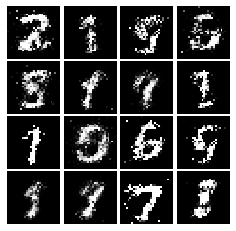

Epoch: 5, Iter: 2520, D: 1.318, G:0.8158


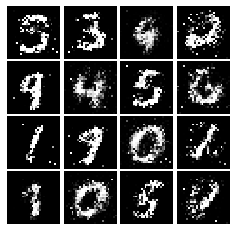

Epoch: 5, Iter: 2540, D: 1.419, G:0.7483


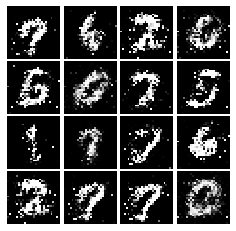

Epoch: 5, Iter: 2560, D: 1.405, G:0.7265


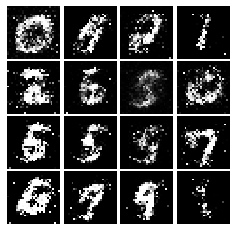

Epoch: 5, Iter: 2580, D: 1.293, G:0.8926


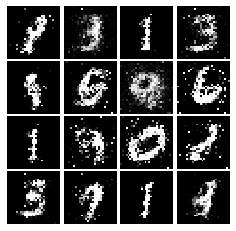

Epoch: 5, Iter: 2600, D: 1.538, G:0.9252


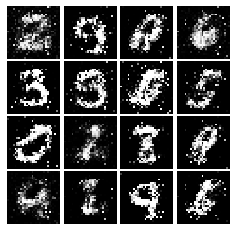

Epoch: 5, Iter: 2620, D: 1.338, G:0.8623


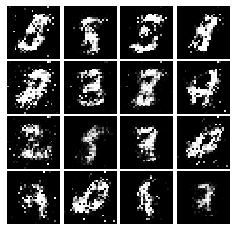

Epoch: 5, Iter: 2640, D: 1.285, G:0.8862


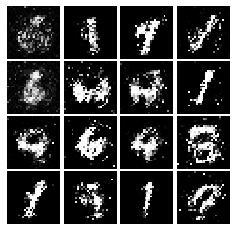

Epoch: 5, Iter: 2660, D: 1.251, G:0.8711


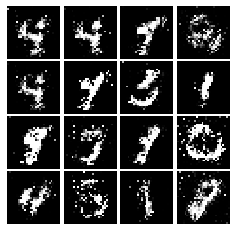

Epoch: 5, Iter: 2680, D: 1.352, G:0.8697


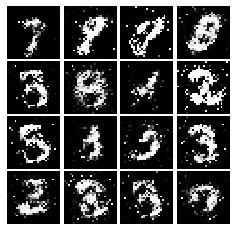

Epoch: 5, Iter: 2700, D: 1.35, G:0.9391


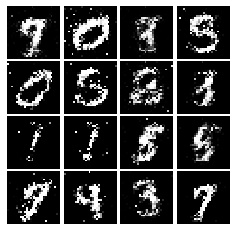

Epoch: 5, Iter: 2720, D: 1.442, G:0.8384


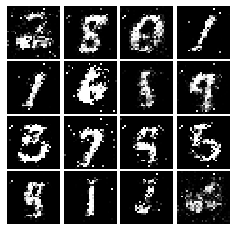

Epoch: 5, Iter: 2740, D: 1.347, G:0.9545


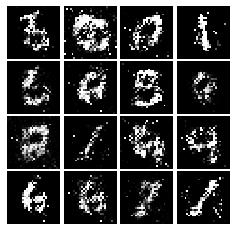

Epoch: 5, Iter: 2760, D: 1.34, G:1.004


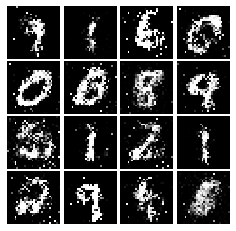

Epoch: 5, Iter: 2780, D: 1.308, G:0.9453


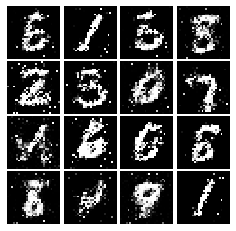

Epoch: 5, Iter: 2800, D: 1.133, G:0.9225


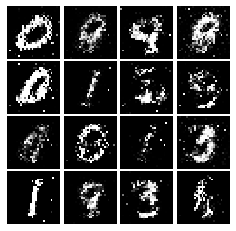

Epoch: 6, Iter: 2820, D: 1.355, G:0.8524


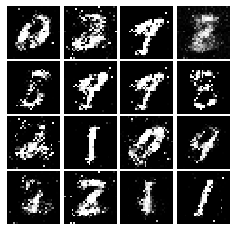

Epoch: 6, Iter: 2840, D: 1.316, G:0.9339


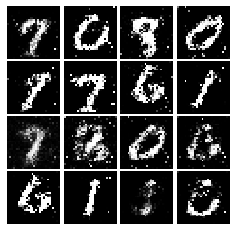

Epoch: 6, Iter: 2860, D: 1.37, G:1.158


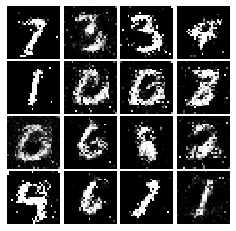

Epoch: 6, Iter: 2880, D: 1.063, G:1.323


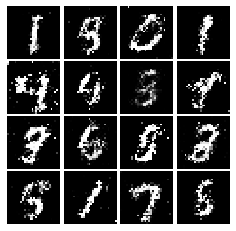

Epoch: 6, Iter: 2900, D: 1.343, G:0.808


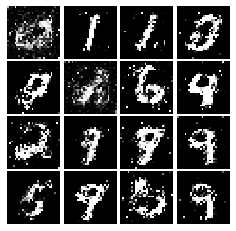

Epoch: 6, Iter: 2920, D: 1.316, G:1.278


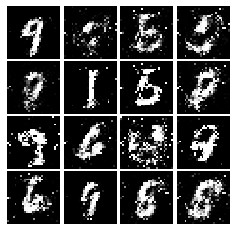

Epoch: 6, Iter: 2940, D: 1.292, G:1.076


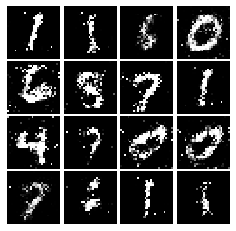

Epoch: 6, Iter: 2960, D: 1.294, G:0.776


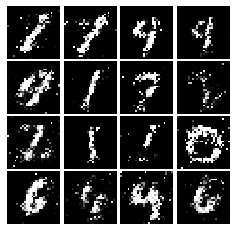

Epoch: 6, Iter: 2980, D: 1.432, G:0.7664


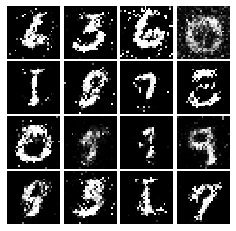

Epoch: 6, Iter: 3000, D: 1.295, G:0.8312


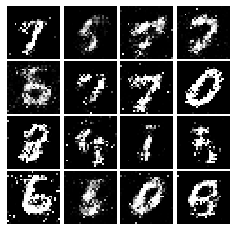

Epoch: 6, Iter: 3020, D: 1.308, G:1.498


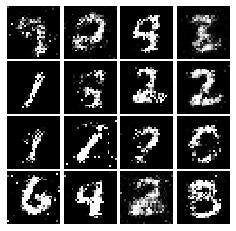

Epoch: 6, Iter: 3040, D: 1.35, G:0.756


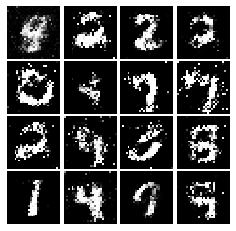

Epoch: 6, Iter: 3060, D: 1.33, G:0.8982


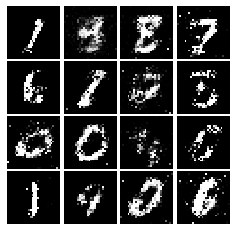

Epoch: 6, Iter: 3080, D: 1.296, G:0.8088


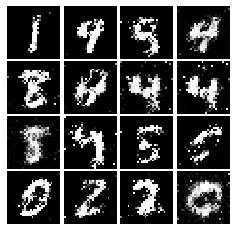

Epoch: 6, Iter: 3100, D: 1.309, G:0.7897


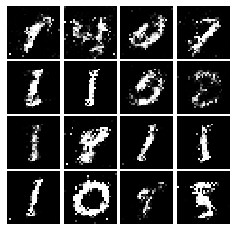

Epoch: 6, Iter: 3120, D: 1.37, G:0.7412


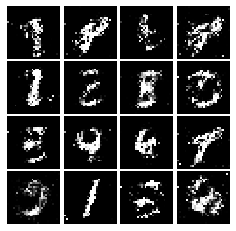

Epoch: 6, Iter: 3140, D: 1.346, G:0.7743


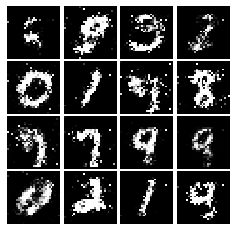

Epoch: 6, Iter: 3160, D: 1.384, G:0.8045


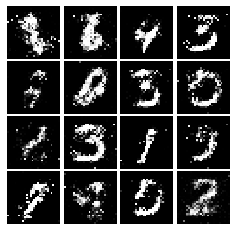

Epoch: 6, Iter: 3180, D: 1.327, G:0.8018


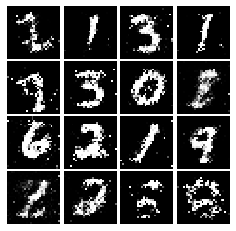

Epoch: 6, Iter: 3200, D: 1.463, G:0.7669


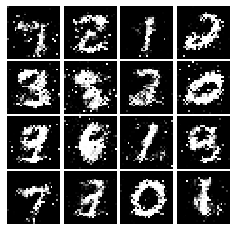

Epoch: 6, Iter: 3220, D: 1.362, G:0.7483


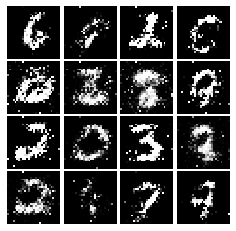

Epoch: 6, Iter: 3240, D: 1.363, G:0.7603


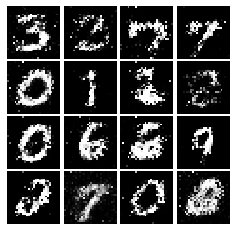

Epoch: 6, Iter: 3260, D: 1.399, G:0.7008


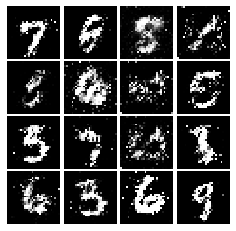

Epoch: 6, Iter: 3280, D: 1.297, G:0.8083


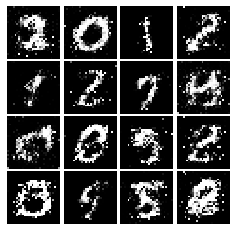

Epoch: 7, Iter: 3300, D: 1.21, G:0.7139


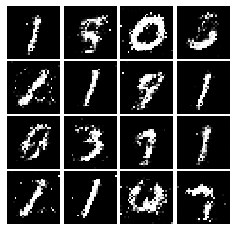

Epoch: 7, Iter: 3320, D: 1.274, G:0.7021


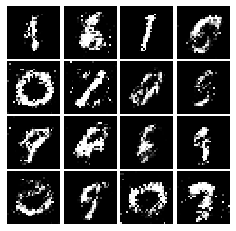

Epoch: 7, Iter: 3340, D: 1.295, G:0.8479


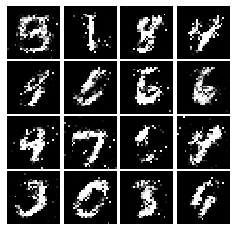

Epoch: 7, Iter: 3360, D: 1.393, G:0.7943


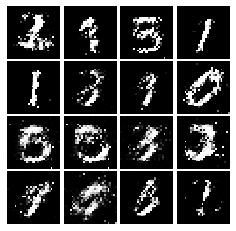

Epoch: 7, Iter: 3380, D: 1.343, G:0.8172


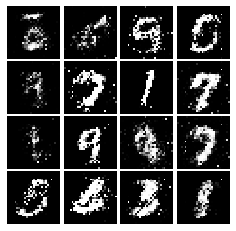

Epoch: 7, Iter: 3400, D: 1.395, G:0.7356


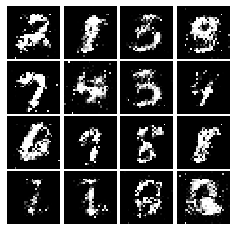

Epoch: 7, Iter: 3420, D: 1.306, G:0.8214


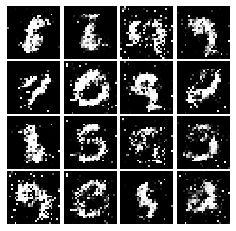

Epoch: 7, Iter: 3440, D: 1.198, G:0.8933


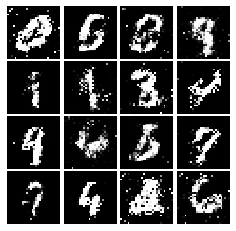

Epoch: 7, Iter: 3460, D: 1.203, G:0.9182


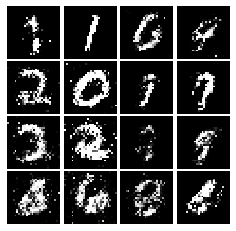

Epoch: 7, Iter: 3480, D: 1.39, G:0.7073


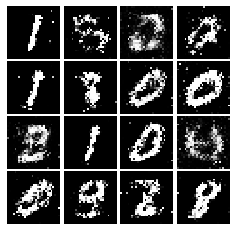

Epoch: 7, Iter: 3500, D: 1.318, G:0.8701


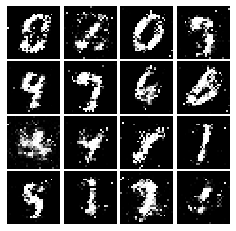

Epoch: 7, Iter: 3520, D: 1.252, G:0.8719


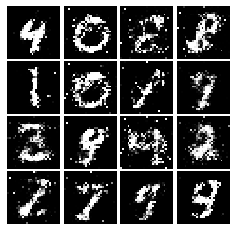

Epoch: 7, Iter: 3540, D: 1.244, G:0.7829


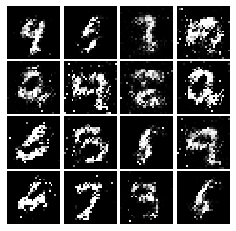

Epoch: 7, Iter: 3560, D: 1.328, G:1.234


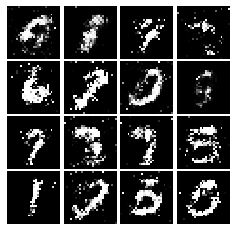

Epoch: 7, Iter: 3580, D: 1.361, G:0.8689


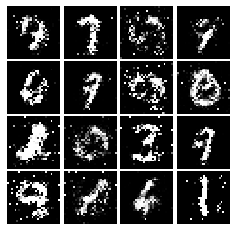

Epoch: 7, Iter: 3600, D: 1.369, G:0.8098


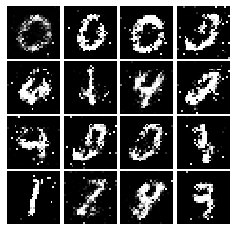

Epoch: 7, Iter: 3620, D: 1.402, G:0.6915


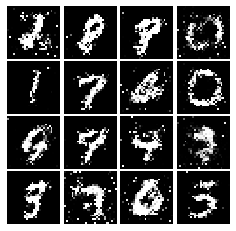

Epoch: 7, Iter: 3640, D: 1.326, G:0.8638


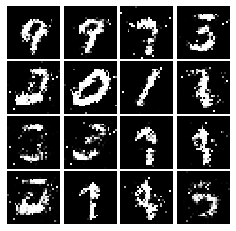

Epoch: 7, Iter: 3660, D: 1.273, G:0.9294


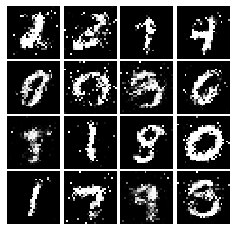

Epoch: 7, Iter: 3680, D: 1.294, G:0.7907


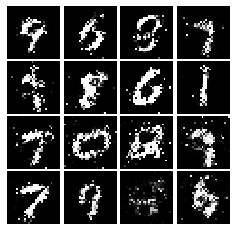

Epoch: 7, Iter: 3700, D: 1.221, G:0.9164


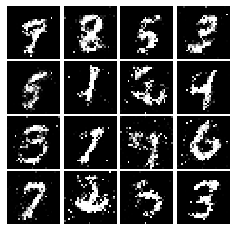

Epoch: 7, Iter: 3720, D: 1.338, G:0.8525


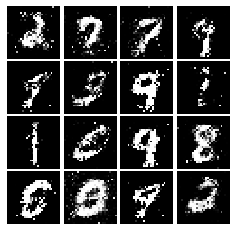

Epoch: 7, Iter: 3740, D: 1.374, G:0.7631


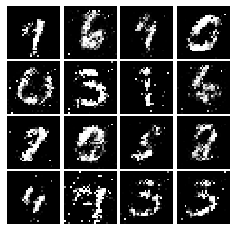

Epoch: 8, Iter: 3760, D: 1.302, G:0.8573


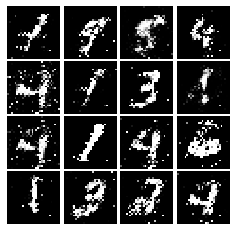

Epoch: 8, Iter: 3780, D: 1.335, G:0.7929


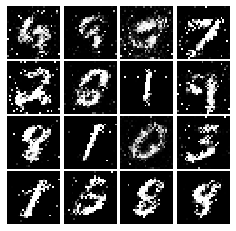

Epoch: 8, Iter: 3800, D: 1.326, G:0.8587


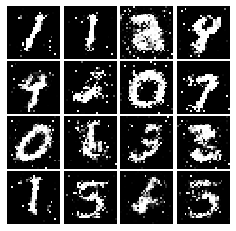

Epoch: 8, Iter: 3820, D: 1.375, G:0.9348


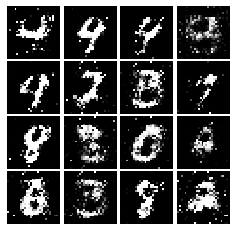

Epoch: 8, Iter: 3840, D: 1.298, G:0.7765


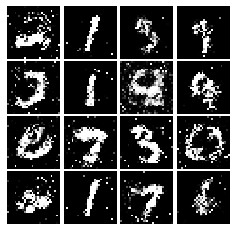

Epoch: 8, Iter: 3860, D: 1.23, G:0.8135


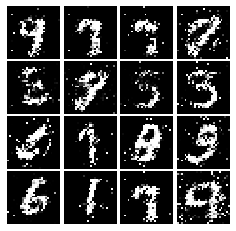

Epoch: 8, Iter: 3880, D: 1.286, G:0.9076


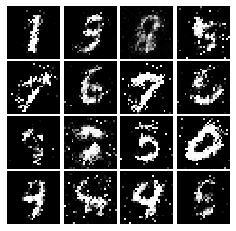

Epoch: 8, Iter: 3900, D: 1.37, G:0.8981


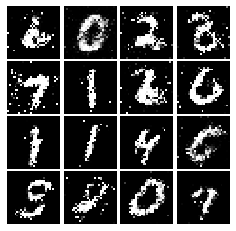

Epoch: 8, Iter: 3920, D: 1.297, G:0.7728


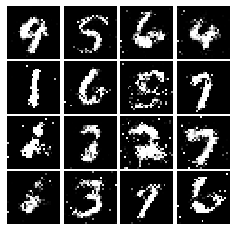

Epoch: 8, Iter: 3940, D: 1.35, G:0.7464


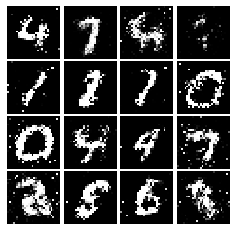

Epoch: 8, Iter: 3960, D: 1.28, G:0.8524


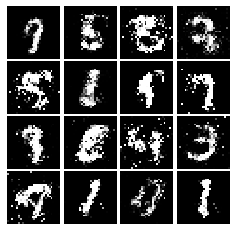

Epoch: 8, Iter: 3980, D: 1.363, G:0.9285


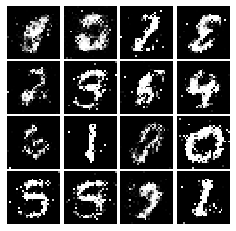

Epoch: 8, Iter: 4000, D: 1.272, G:0.859


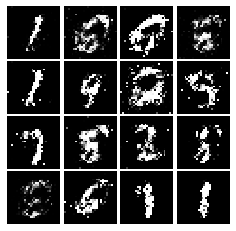

Epoch: 8, Iter: 4020, D: 1.334, G:0.7854


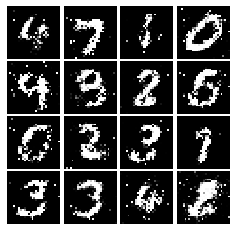

Epoch: 8, Iter: 4040, D: 1.365, G:0.7786


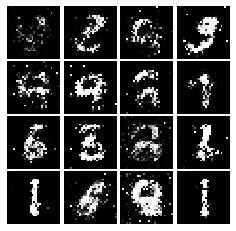

Epoch: 8, Iter: 4060, D: 1.297, G:0.7338


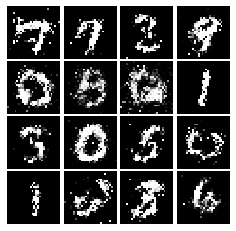

Epoch: 8, Iter: 4080, D: 1.314, G:0.7371


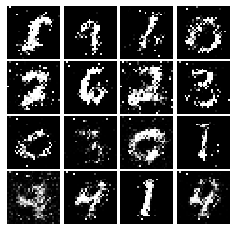

Epoch: 8, Iter: 4100, D: 1.325, G:0.787


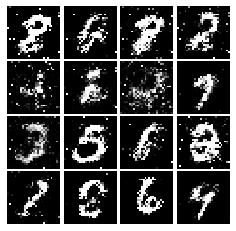

Epoch: 8, Iter: 4120, D: 1.349, G:0.8679


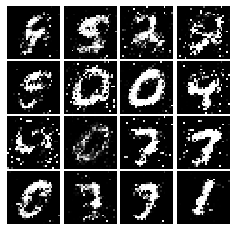

Epoch: 8, Iter: 4140, D: 1.371, G:0.8564


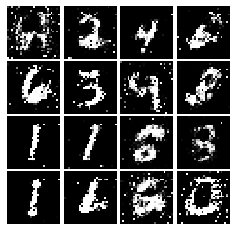

Epoch: 8, Iter: 4160, D: 1.427, G:0.8568


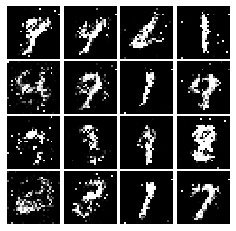

Epoch: 8, Iter: 4180, D: 1.368, G:0.801


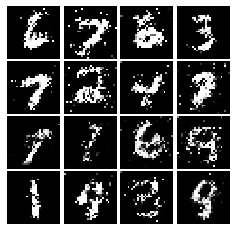

Epoch: 8, Iter: 4200, D: 1.334, G:0.7984


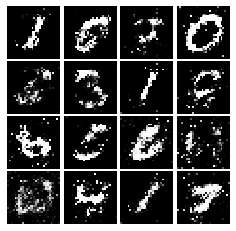

Epoch: 8, Iter: 4220, D: 1.398, G:0.8138


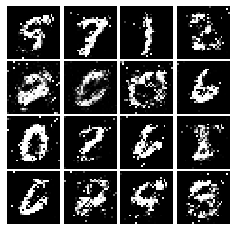

Epoch: 9, Iter: 4240, D: 1.304, G:0.7808


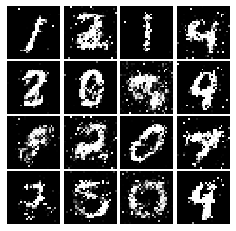

Epoch: 9, Iter: 4260, D: 1.351, G:0.7955


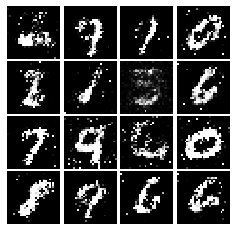

Epoch: 9, Iter: 4280, D: 1.42, G:0.7161


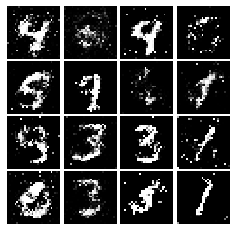

Epoch: 9, Iter: 4300, D: 1.295, G:0.8022


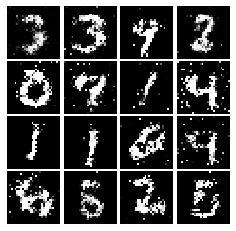

Epoch: 9, Iter: 4320, D: 1.388, G:0.7388


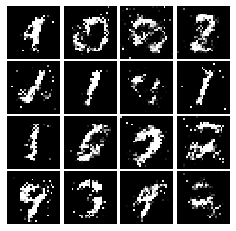

Epoch: 9, Iter: 4340, D: 1.41, G:0.8745


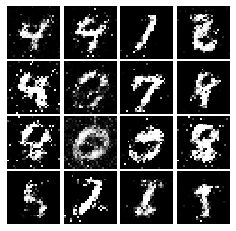

Epoch: 9, Iter: 4360, D: 1.358, G:1.012


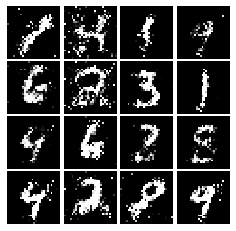

Epoch: 9, Iter: 4380, D: 1.319, G:0.9102


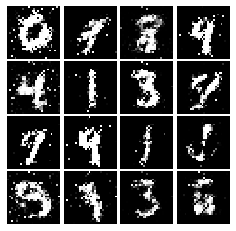

Epoch: 9, Iter: 4400, D: 1.305, G:0.7857


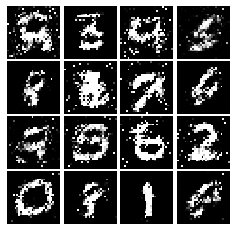

Epoch: 9, Iter: 4420, D: 1.275, G:0.7574


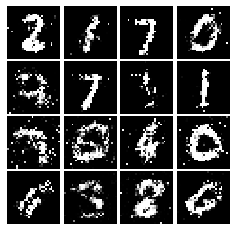

Epoch: 9, Iter: 4440, D: 1.328, G:0.8031


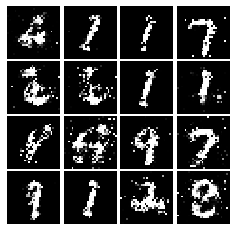

Epoch: 9, Iter: 4460, D: 1.321, G:0.9122


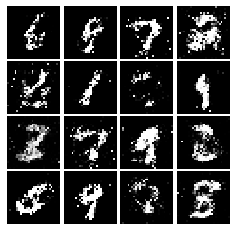

Epoch: 9, Iter: 4480, D: 1.365, G:0.8156


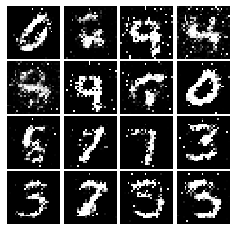

Epoch: 9, Iter: 4500, D: 1.411, G:0.7785


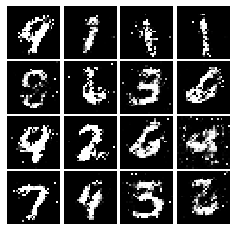

Epoch: 9, Iter: 4520, D: 1.294, G:0.7029


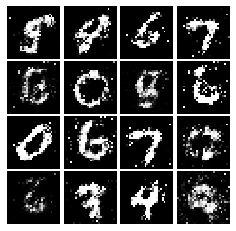

Epoch: 9, Iter: 4540, D: 1.368, G:0.7393


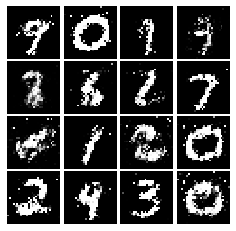

Epoch: 9, Iter: 4560, D: 1.358, G:0.7955


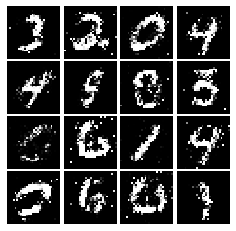

Epoch: 9, Iter: 4580, D: 1.368, G:0.7889


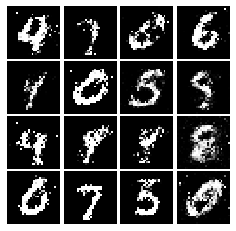

Epoch: 9, Iter: 4600, D: 1.358, G:0.7958


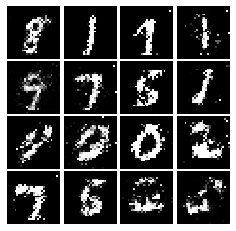

Epoch: 9, Iter: 4620, D: 1.387, G:0.7352


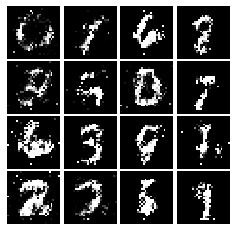

Epoch: 9, Iter: 4640, D: 1.297, G:0.856


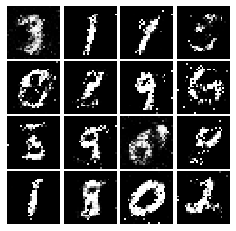

Epoch: 9, Iter: 4660, D: 1.412, G:0.7661


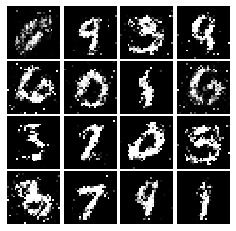

Epoch: 9, Iter: 4680, D: 1.298, G:0.7455


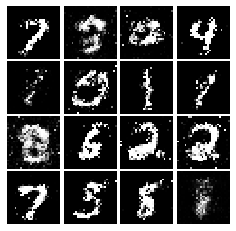

Final images


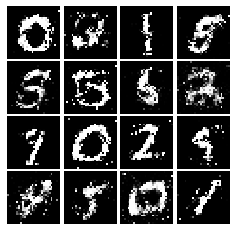

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [0]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
   

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [0]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.5676, G:0.3923


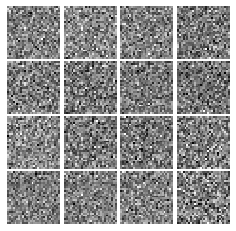

Epoch: 0, Iter: 20, D: 0.1358, G:1.291


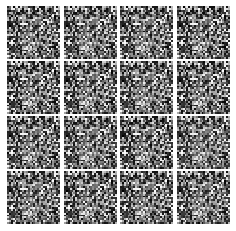

Epoch: 0, Iter: 40, D: 0.01707, G:0.7745


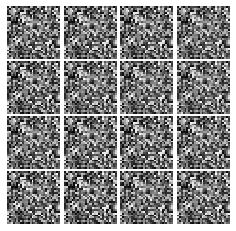

Epoch: 0, Iter: 60, D: 0.2702, G:0.2369


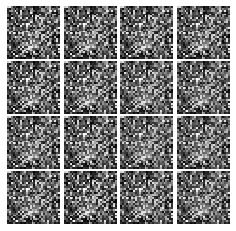

Epoch: 0, Iter: 80, D: 0.03924, G:0.4655


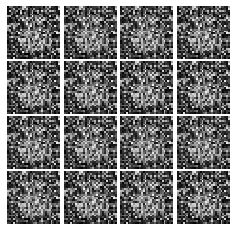

Epoch: 0, Iter: 100, D: 0.1712, G:1.219


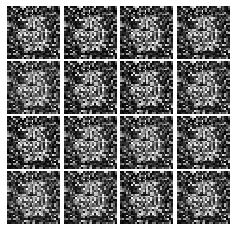

Epoch: 0, Iter: 120, D: 0.4188, G:1.751


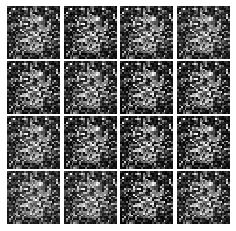

Epoch: 0, Iter: 140, D: 0.1515, G:0.872


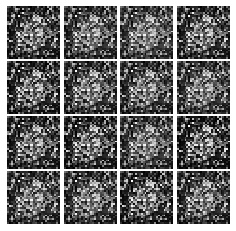

Epoch: 0, Iter: 160, D: 0.09196, G:0.3778


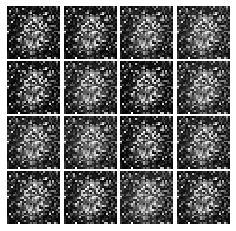

Epoch: 0, Iter: 180, D: 0.08467, G:0.8428


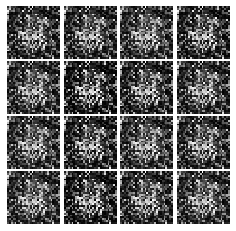

Epoch: 0, Iter: 200, D: 0.06358, G:0.3451


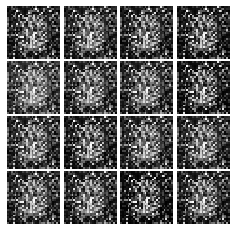

Epoch: 0, Iter: 220, D: 0.1823, G:0.6431


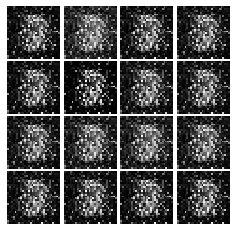

Epoch: 0, Iter: 240, D: 0.2528, G:0.6495


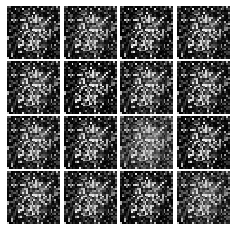

Epoch: 0, Iter: 260, D: 0.2235, G:1.187


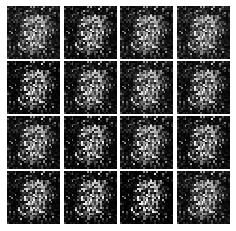

Epoch: 0, Iter: 280, D: 0.1157, G:0.2496


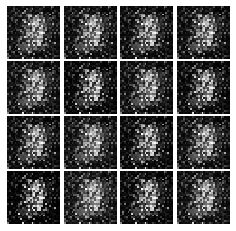

Epoch: 0, Iter: 300, D: 0.1821, G:0.2443


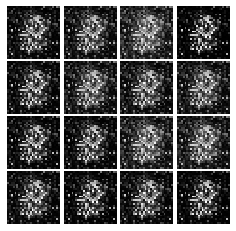

Epoch: 0, Iter: 320, D: 0.0779, G:0.5014


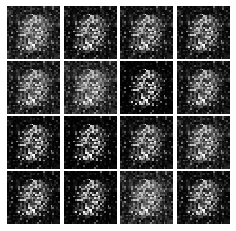

Epoch: 0, Iter: 340, D: 0.1054, G:0.4095


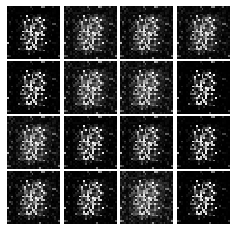

Epoch: 0, Iter: 360, D: 0.1183, G:0.813


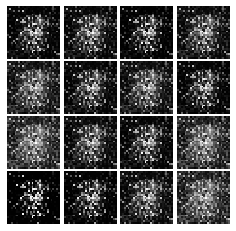

Epoch: 0, Iter: 380, D: 0.1939, G:0.6267


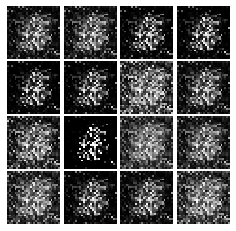

Epoch: 0, Iter: 400, D: 0.1129, G:0.3911


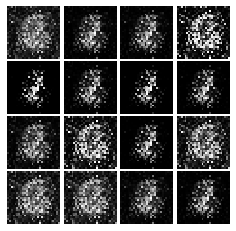

Epoch: 0, Iter: 420, D: 0.1256, G:0.4071


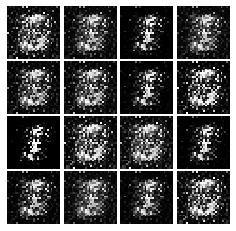

Epoch: 0, Iter: 440, D: 0.07313, G:0.584


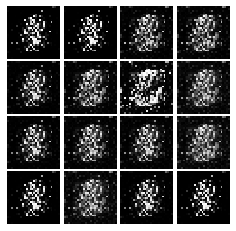

Epoch: 0, Iter: 460, D: 0.08494, G:0.4191


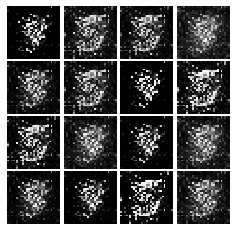

Epoch: 1, Iter: 480, D: 0.1448, G:0.4817


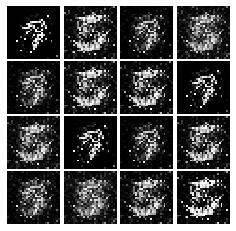

Epoch: 1, Iter: 500, D: 0.0771, G:0.4078


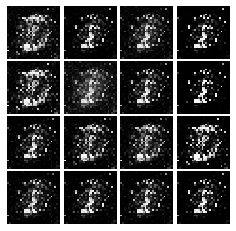

Epoch: 1, Iter: 520, D: 0.1193, G:0.436


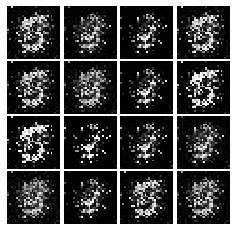

Epoch: 1, Iter: 540, D: 0.2068, G:0.04394


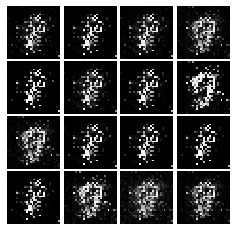

Epoch: 1, Iter: 560, D: 0.08969, G:0.8659


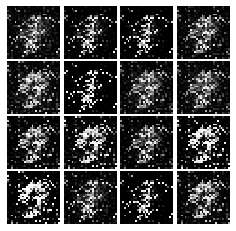

Epoch: 1, Iter: 580, D: 0.1702, G:0.2956


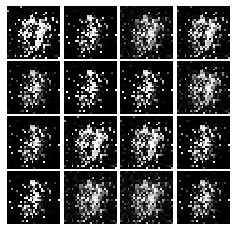

Epoch: 1, Iter: 600, D: 0.1612, G:0.3257


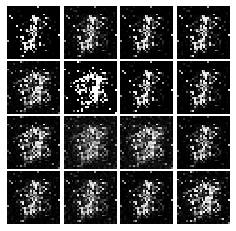

Epoch: 1, Iter: 620, D: 0.08846, G:1.13


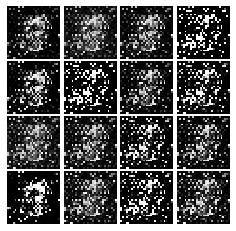

Epoch: 1, Iter: 640, D: 0.1924, G:0.4366


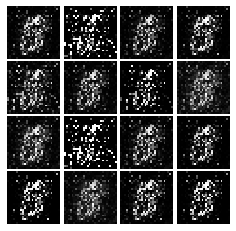

Epoch: 1, Iter: 660, D: 0.1522, G:0.8501


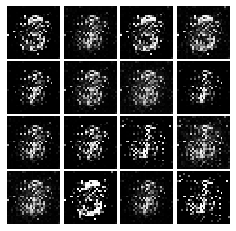

Epoch: 1, Iter: 680, D: 0.5078, G:0.01837


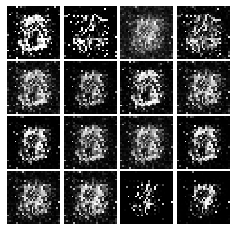

Epoch: 1, Iter: 700, D: 0.2345, G:0.2758


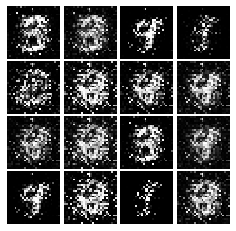

Epoch: 1, Iter: 720, D: 0.225, G:0.3009


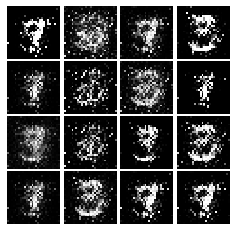

Epoch: 1, Iter: 740, D: 0.1498, G:0.3639


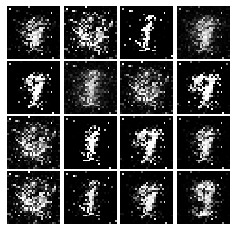

Epoch: 1, Iter: 760, D: 0.1945, G:0.2623


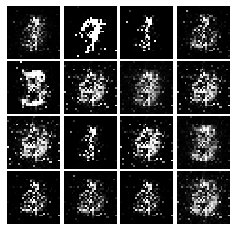

Epoch: 1, Iter: 780, D: 0.1222, G:0.3159


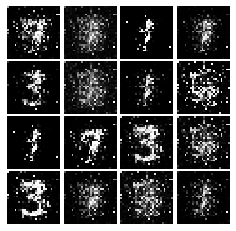

Epoch: 1, Iter: 800, D: 0.1686, G:0.82


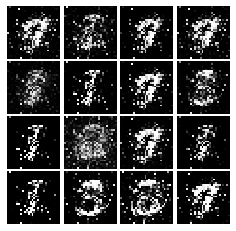

Epoch: 1, Iter: 820, D: 0.1102, G:0.3394


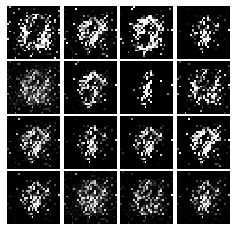

Epoch: 1, Iter: 840, D: 0.1525, G:0.4533


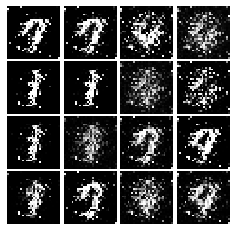

Epoch: 1, Iter: 860, D: 0.1196, G:0.4279


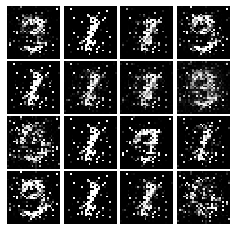

Epoch: 1, Iter: 880, D: 0.4488, G:0.1837


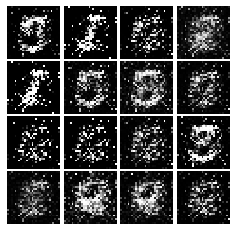

Epoch: 1, Iter: 900, D: 0.08906, G:0.428


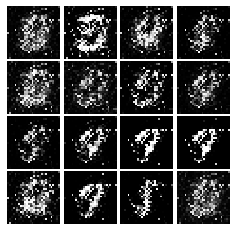

Epoch: 1, Iter: 920, D: 0.117, G:0.3679


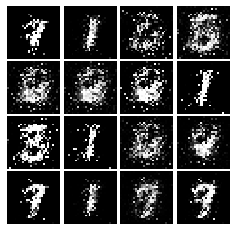

Epoch: 2, Iter: 940, D: 0.1459, G:0.3068


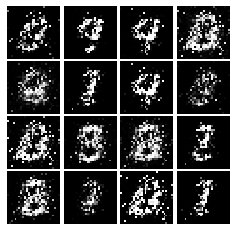

Epoch: 2, Iter: 960, D: 0.3342, G:0.03997


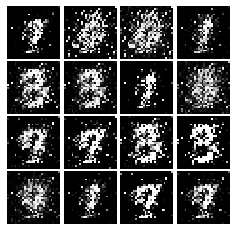

Epoch: 2, Iter: 980, D: 0.147, G:0.3213


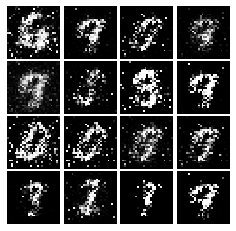

Epoch: 2, Iter: 1000, D: 0.1411, G:0.5379


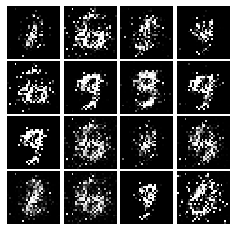

Epoch: 2, Iter: 1020, D: 0.1332, G:0.3349


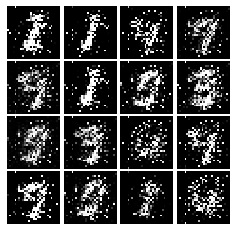

Epoch: 2, Iter: 1040, D: 0.1056, G:0.6081


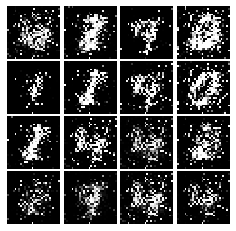

Epoch: 2, Iter: 1060, D: 0.1599, G:0.3174


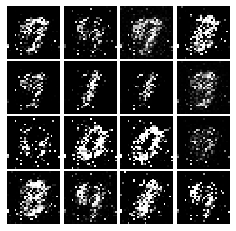

Epoch: 2, Iter: 1080, D: 0.1613, G:0.3192


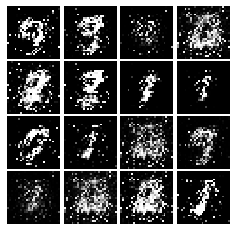

Epoch: 2, Iter: 1100, D: 0.1442, G:0.3514


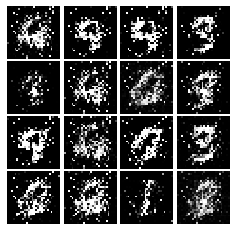

Epoch: 2, Iter: 1120, D: 0.1312, G:0.3501


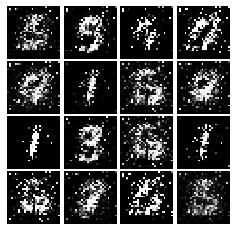

Epoch: 2, Iter: 1140, D: 0.1172, G:0.3898


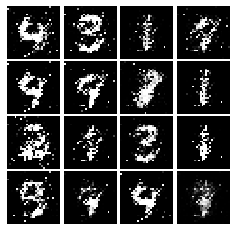

Epoch: 2, Iter: 1160, D: 0.1413, G:0.3284


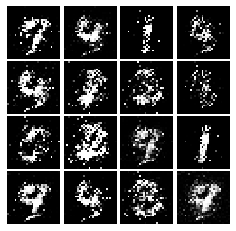

Epoch: 2, Iter: 1180, D: 0.1736, G:0.2537


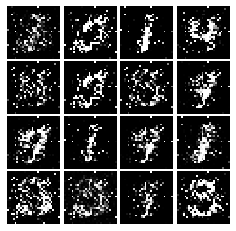

Epoch: 2, Iter: 1200, D: 0.3247, G:0.2089


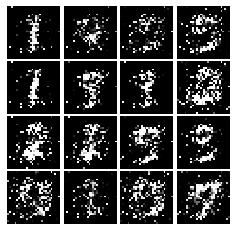

Epoch: 2, Iter: 1220, D: 0.145, G:0.2323


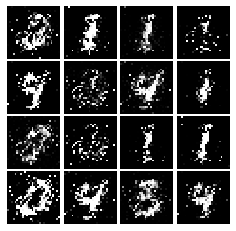

Epoch: 2, Iter: 1240, D: 0.1188, G:0.2489


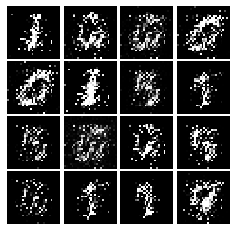

Epoch: 2, Iter: 1260, D: 0.1903, G:0.323


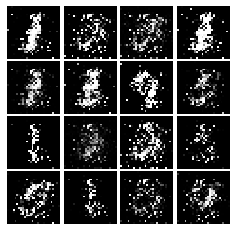

Epoch: 2, Iter: 1280, D: 0.182, G:0.2622


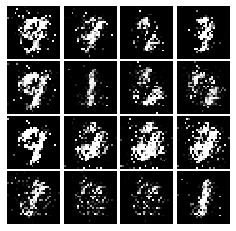

Epoch: 2, Iter: 1300, D: 0.2478, G:0.1752


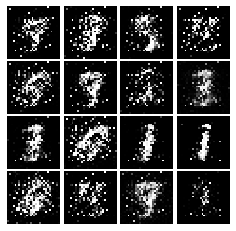

Epoch: 2, Iter: 1320, D: 0.1917, G:0.1831


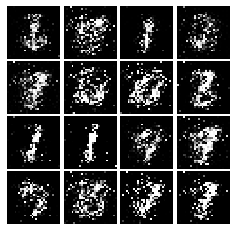

Epoch: 2, Iter: 1340, D: 0.1323, G:0.3039


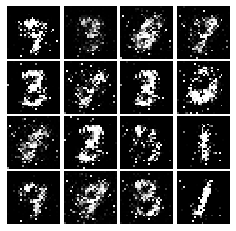

Epoch: 2, Iter: 1360, D: 0.1342, G:0.3155


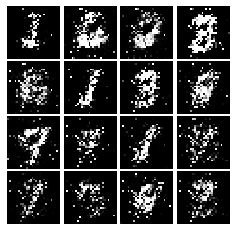

Epoch: 2, Iter: 1380, D: 0.1647, G:0.2496


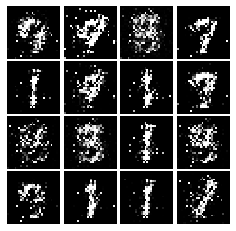

Epoch: 2, Iter: 1400, D: 0.1058, G:0.3011


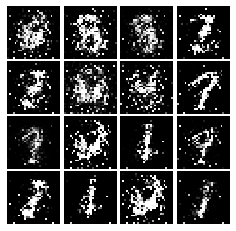

Epoch: 3, Iter: 1420, D: 0.1829, G:0.2025


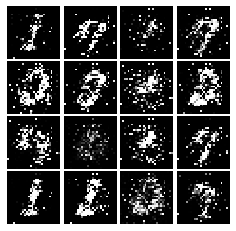

Epoch: 3, Iter: 1440, D: 0.1444, G:0.3703


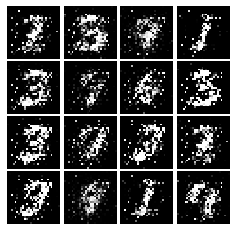

Epoch: 3, Iter: 1460, D: 0.1783, G:0.3087


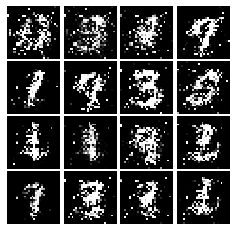

Epoch: 3, Iter: 1480, D: 0.173, G:0.3638


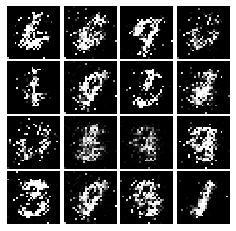

Epoch: 3, Iter: 1500, D: 0.1727, G:0.262


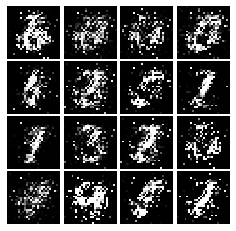

Epoch: 3, Iter: 1520, D: 0.2069, G:0.2858


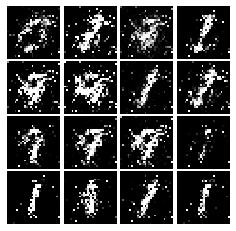

Epoch: 3, Iter: 1540, D: 0.1789, G:0.2601


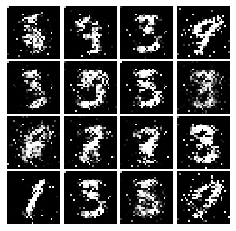

Epoch: 3, Iter: 1560, D: 0.2187, G:0.1918


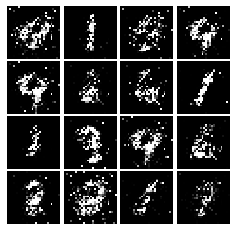

Epoch: 3, Iter: 1580, D: 0.1869, G:0.2359


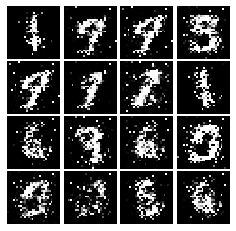

Epoch: 3, Iter: 1600, D: 0.1863, G:0.3187


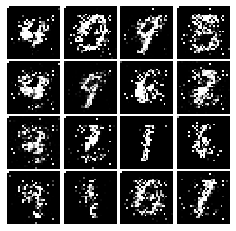

Epoch: 3, Iter: 1620, D: 0.2172, G:0.253


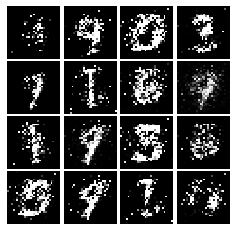

Epoch: 3, Iter: 1640, D: 0.1881, G:0.2338


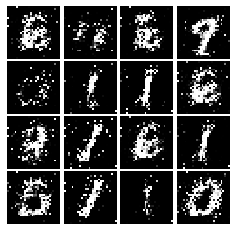

Epoch: 3, Iter: 1660, D: 0.1759, G:0.294


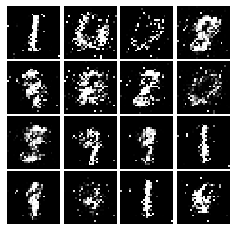

Epoch: 3, Iter: 1680, D: 0.176, G:0.2543


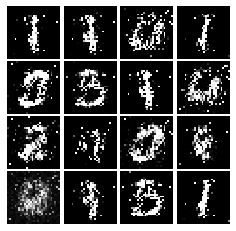

Epoch: 3, Iter: 1700, D: 0.1883, G:0.193


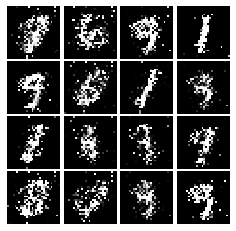

Epoch: 3, Iter: 1720, D: 0.2015, G:0.2189


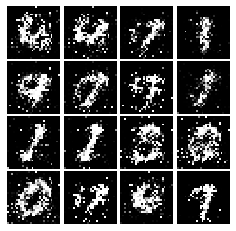

Epoch: 3, Iter: 1740, D: 0.2008, G:0.2944


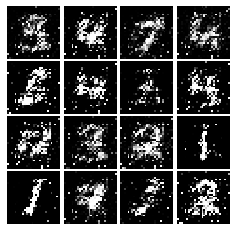

Epoch: 3, Iter: 1760, D: 0.1975, G:0.2222


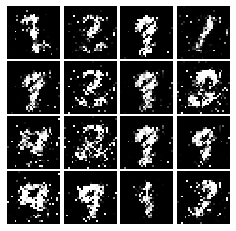

Epoch: 3, Iter: 1780, D: 0.1537, G:0.2192


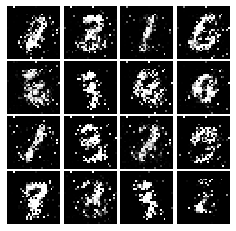

Epoch: 3, Iter: 1800, D: 0.2062, G:0.2323


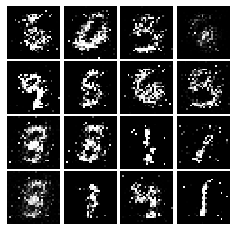

Epoch: 3, Iter: 1820, D: 0.1935, G:0.2004


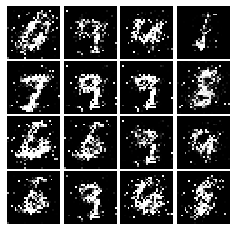

Epoch: 3, Iter: 1840, D: 0.1789, G:0.2516


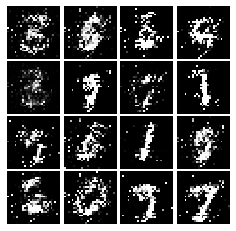

Epoch: 3, Iter: 1860, D: 0.2096, G:0.2318


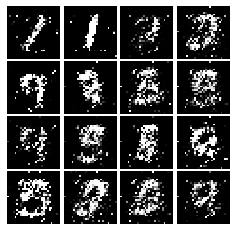

Epoch: 4, Iter: 1880, D: 0.2057, G:0.2358


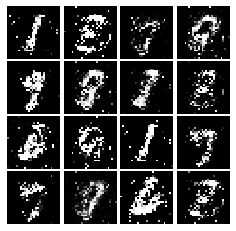

Epoch: 4, Iter: 1900, D: 0.1924, G:0.2148


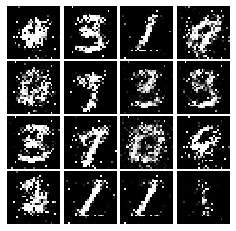

Epoch: 4, Iter: 1920, D: 0.1686, G:0.1965


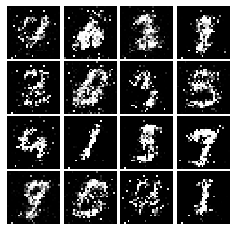

Epoch: 4, Iter: 1940, D: 0.1985, G:0.2213


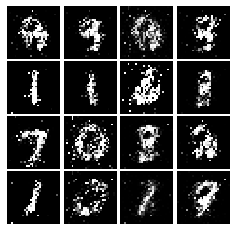

Epoch: 4, Iter: 1960, D: 0.1978, G:0.2194


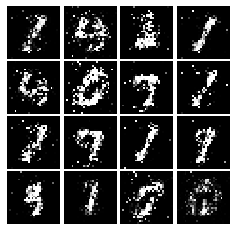

Epoch: 4, Iter: 1980, D: 0.1709, G:0.224


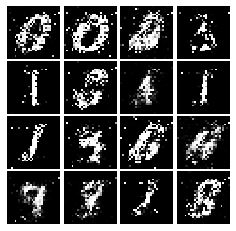

Epoch: 4, Iter: 2000, D: 0.1953, G:0.2565


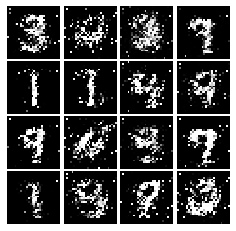

Epoch: 4, Iter: 2020, D: 0.1679, G:0.2273


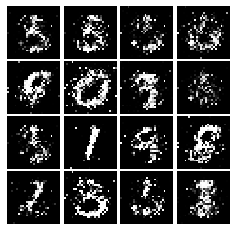

Epoch: 4, Iter: 2040, D: 0.1797, G:0.2531


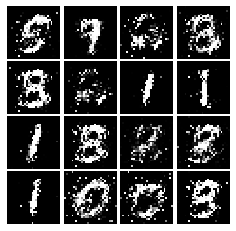

Epoch: 4, Iter: 2060, D: 0.184, G:0.2431


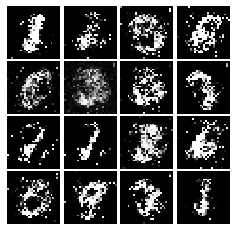

Epoch: 4, Iter: 2080, D: 0.2209, G:0.2208


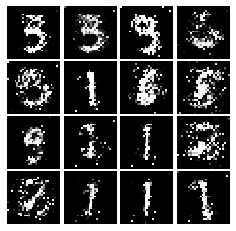

Epoch: 4, Iter: 2100, D: 0.1925, G:0.218


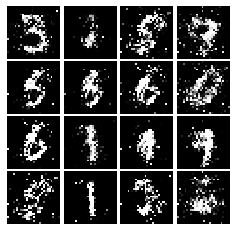

Epoch: 4, Iter: 2120, D: 0.1903, G:0.2255


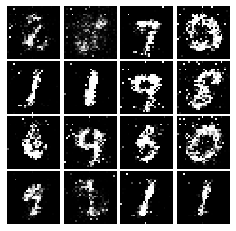

Epoch: 4, Iter: 2140, D: 0.2119, G:0.1915


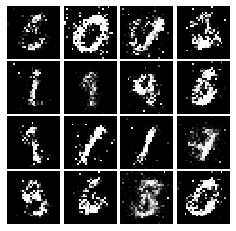

Epoch: 4, Iter: 2160, D: 0.191, G:0.233


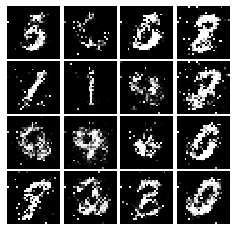

Epoch: 4, Iter: 2180, D: 0.1997, G:0.207


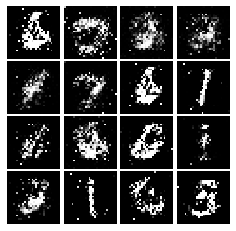

Epoch: 4, Iter: 2200, D: 0.1784, G:0.3149


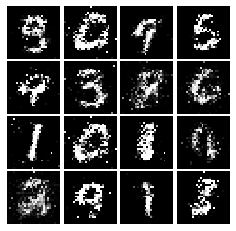

Epoch: 4, Iter: 2220, D: 0.2774, G:0.1947


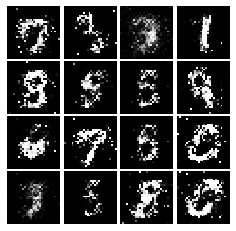

Epoch: 4, Iter: 2240, D: 0.2192, G:0.1802


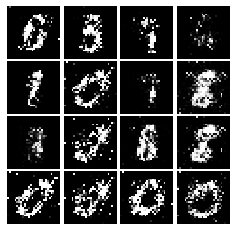

Epoch: 4, Iter: 2260, D: 0.189, G:0.2492


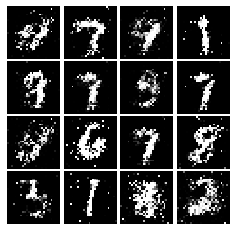

Epoch: 4, Iter: 2280, D: 0.1958, G:0.2461


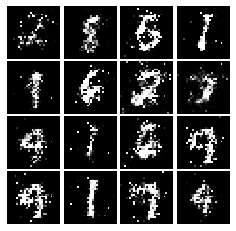

Epoch: 4, Iter: 2300, D: 0.2169, G:0.1904


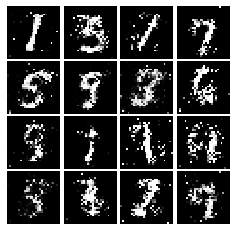

Epoch: 4, Iter: 2320, D: 0.1812, G:0.2063


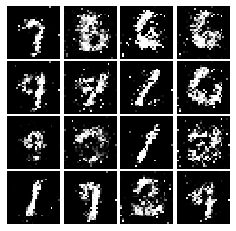

Epoch: 4, Iter: 2340, D: 0.1874, G:0.1723


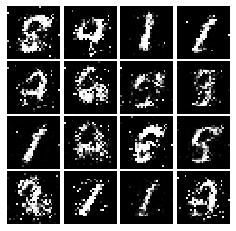

Epoch: 5, Iter: 2360, D: 0.1942, G:0.2506


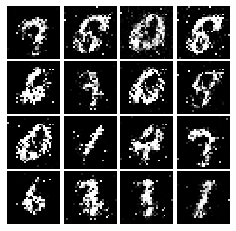

Epoch: 5, Iter: 2380, D: 0.2008, G:0.1705


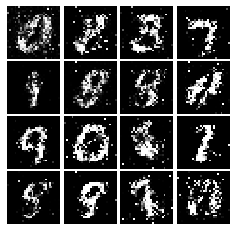

Epoch: 5, Iter: 2400, D: 0.2256, G:0.2011


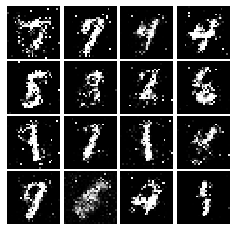

Epoch: 5, Iter: 2420, D: 0.2173, G:0.2889


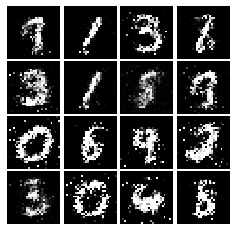

Epoch: 5, Iter: 2440, D: 0.2101, G:0.1871


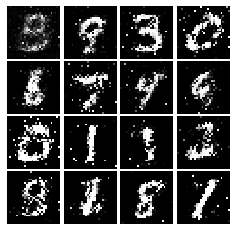

Epoch: 5, Iter: 2460, D: 0.1828, G:0.2514


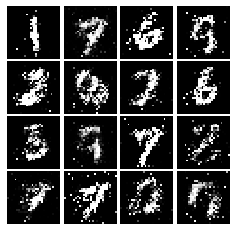

Epoch: 5, Iter: 2480, D: 0.1888, G:0.1962


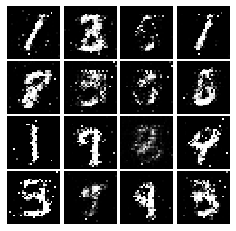

Epoch: 5, Iter: 2500, D: 0.1895, G:0.2481


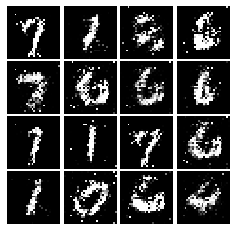

Epoch: 5, Iter: 2520, D: 0.2385, G:0.1672


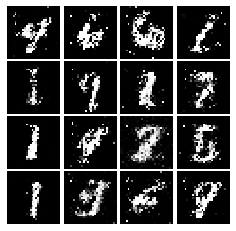

Epoch: 5, Iter: 2540, D: 0.2151, G:0.2452


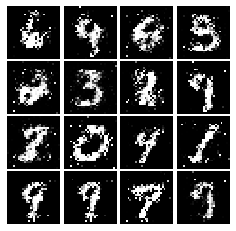

Epoch: 5, Iter: 2560, D: 0.2216, G:0.1916


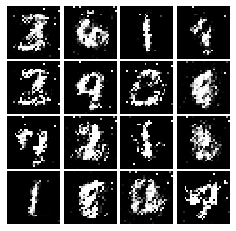

Epoch: 5, Iter: 2580, D: 0.2185, G:0.2027


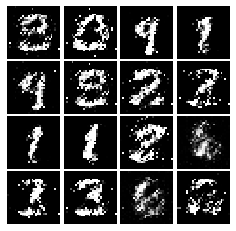

Epoch: 5, Iter: 2600, D: 0.2558, G:0.1532


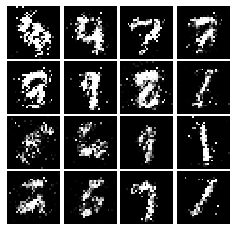

Epoch: 5, Iter: 2620, D: 0.195, G:0.2174


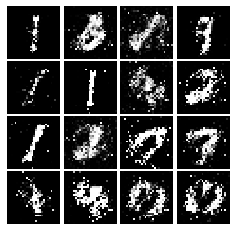

Epoch: 5, Iter: 2640, D: 0.2149, G:0.2773


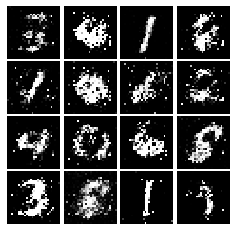

Epoch: 5, Iter: 2660, D: 0.2, G:0.2507


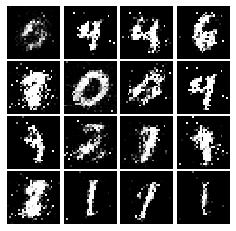

Epoch: 5, Iter: 2680, D: 0.2455, G:0.1878


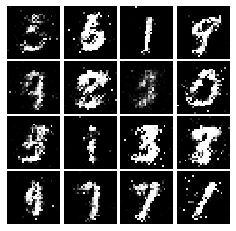

Epoch: 5, Iter: 2700, D: 0.2273, G:0.1776


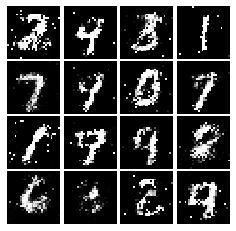

Epoch: 5, Iter: 2720, D: 0.2115, G:0.1944


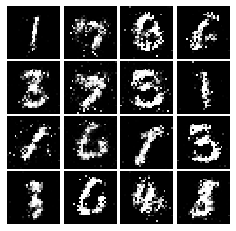

Epoch: 5, Iter: 2740, D: 0.2205, G:0.1996


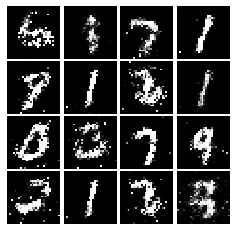

Epoch: 5, Iter: 2760, D: 0.2159, G:0.188


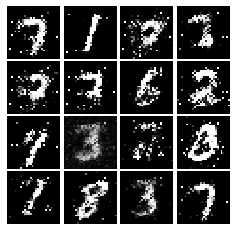

Epoch: 5, Iter: 2780, D: 0.2089, G:0.1814


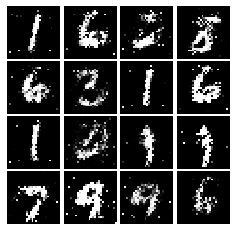

Epoch: 5, Iter: 2800, D: 0.2235, G:0.163


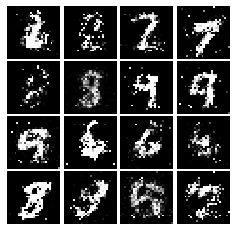

Epoch: 6, Iter: 2820, D: 0.2045, G:0.2022


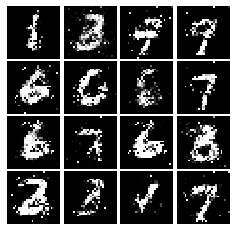

Epoch: 6, Iter: 2840, D: 0.2085, G:0.2035


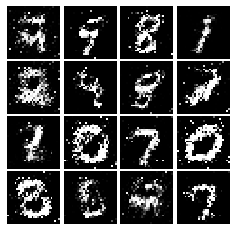

Epoch: 6, Iter: 2860, D: 0.2174, G:0.1954


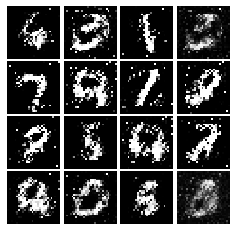

Epoch: 6, Iter: 2880, D: 0.1975, G:0.2617


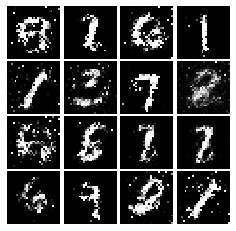

Epoch: 6, Iter: 2900, D: 0.2113, G:0.22


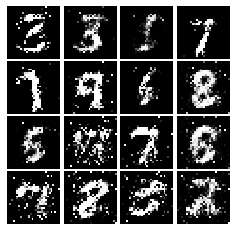

Epoch: 6, Iter: 2920, D: 0.2234, G:0.2097


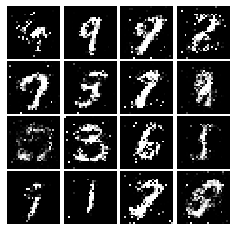

Epoch: 6, Iter: 2940, D: 0.2099, G:0.1961


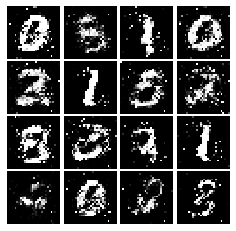

Epoch: 6, Iter: 2960, D: 0.205, G:0.1839


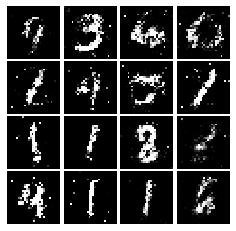

Epoch: 6, Iter: 2980, D: 0.2255, G:0.2273


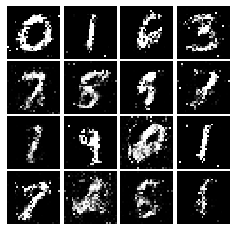

Epoch: 6, Iter: 3000, D: 0.2226, G:0.1776


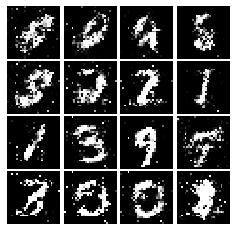

Epoch: 6, Iter: 3020, D: 0.2175, G:0.2105


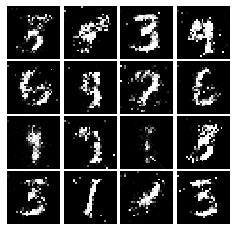

Epoch: 6, Iter: 3040, D: 0.2298, G:0.217


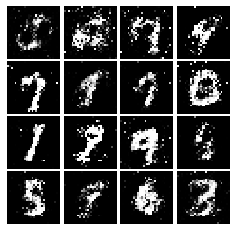

Epoch: 6, Iter: 3060, D: 0.2052, G:0.2471


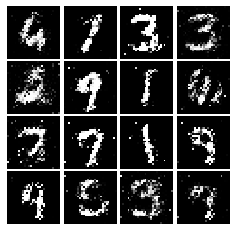

Epoch: 6, Iter: 3080, D: 0.2245, G:0.1669


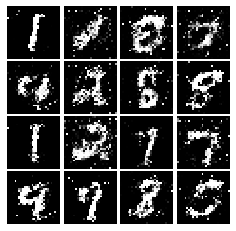

Epoch: 6, Iter: 3100, D: 0.2052, G:0.1746


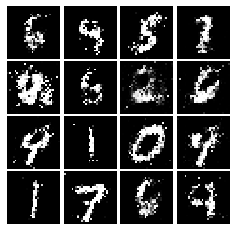

Epoch: 6, Iter: 3120, D: 0.207, G:0.1664


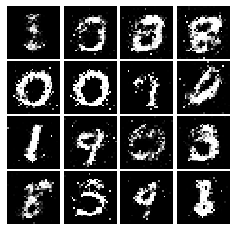

Epoch: 6, Iter: 3140, D: 0.2091, G:0.1848


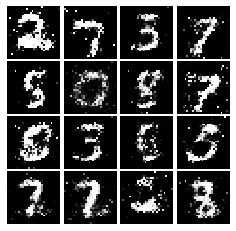

Epoch: 6, Iter: 3160, D: 0.1979, G:0.1792


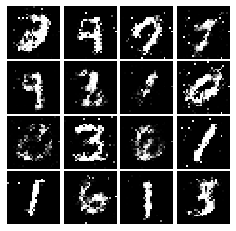

Epoch: 6, Iter: 3180, D: 0.2028, G:0.1765


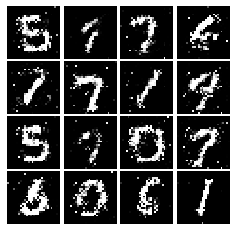

Epoch: 6, Iter: 3200, D: 0.2267, G:0.1771


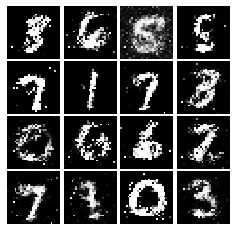

Epoch: 6, Iter: 3220, D: 0.2082, G:0.2123


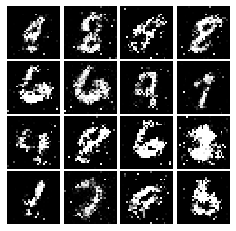

Epoch: 6, Iter: 3240, D: 0.1922, G:0.196


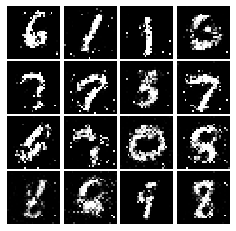

Epoch: 6, Iter: 3260, D: 0.2312, G:0.1899


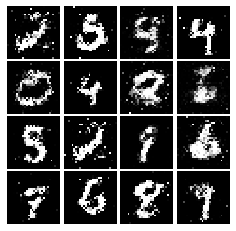

Epoch: 6, Iter: 3280, D: 0.2323, G:0.1591


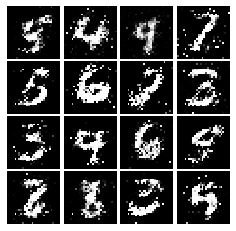

Epoch: 7, Iter: 3300, D: 0.2126, G:0.1883


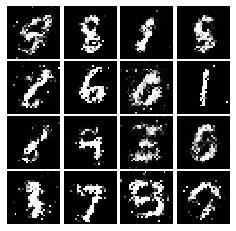

Epoch: 7, Iter: 3320, D: 0.1998, G:0.1944


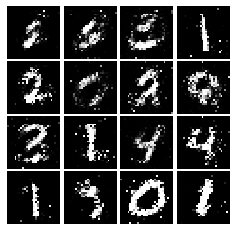

Epoch: 7, Iter: 3340, D: 0.2177, G:0.1989


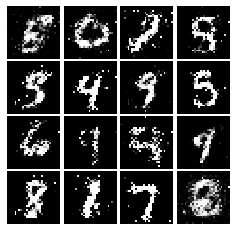

Epoch: 7, Iter: 3360, D: 0.2224, G:0.159


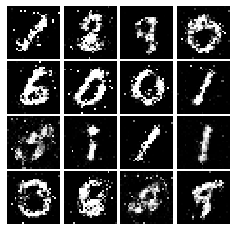

Epoch: 7, Iter: 3380, D: 0.2277, G:0.1753


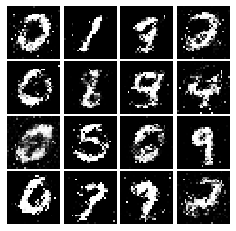

Epoch: 7, Iter: 3400, D: 0.2111, G:0.1645


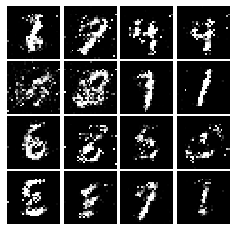

Epoch: 7, Iter: 3420, D: 0.2244, G:0.1805


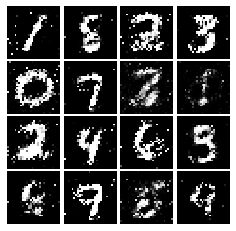

Epoch: 7, Iter: 3440, D: 0.219, G:0.1666


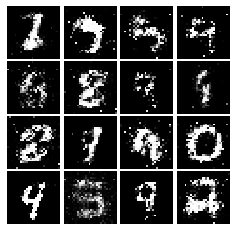

Epoch: 7, Iter: 3460, D: 0.2196, G:0.192


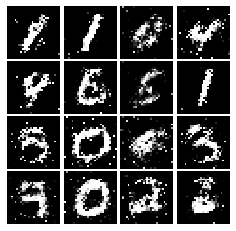

Epoch: 7, Iter: 3480, D: 0.2118, G:0.1874


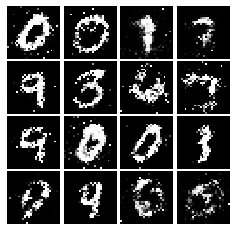

Epoch: 7, Iter: 3500, D: 0.2208, G:0.2042


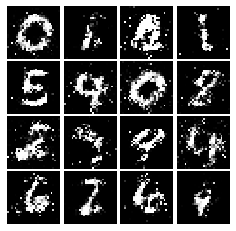

Epoch: 7, Iter: 3520, D: 0.2442, G:0.1614


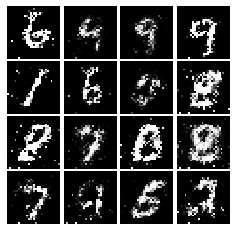

Epoch: 7, Iter: 3540, D: 0.2068, G:0.1948


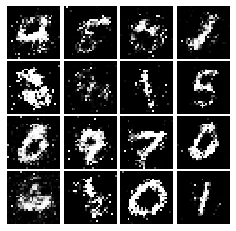

Epoch: 7, Iter: 3560, D: 0.2276, G:0.1991


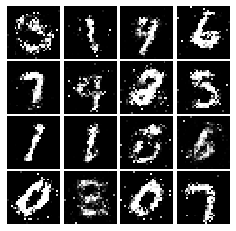

Epoch: 7, Iter: 3580, D: 0.212, G:0.1799


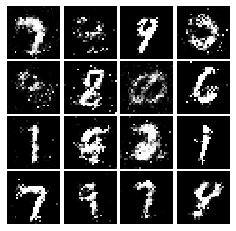

Epoch: 7, Iter: 3600, D: 0.2291, G:0.1659


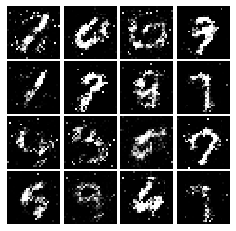

Epoch: 7, Iter: 3620, D: 0.2291, G:0.1925


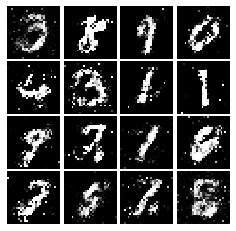

Epoch: 7, Iter: 3640, D: 0.2324, G:0.1965


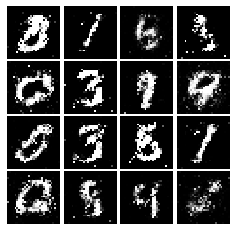

Epoch: 7, Iter: 3660, D: 0.2336, G:0.1731


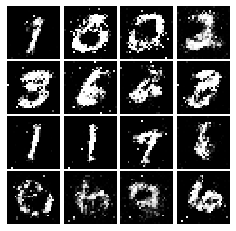

Epoch: 7, Iter: 3680, D: 0.2095, G:0.1903


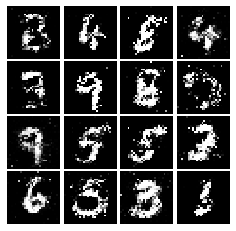

Epoch: 7, Iter: 3700, D: 0.2064, G:0.1828


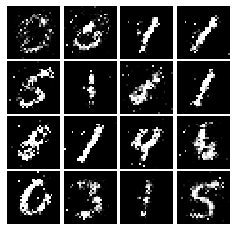

Epoch: 7, Iter: 3720, D: 0.2142, G:0.1743


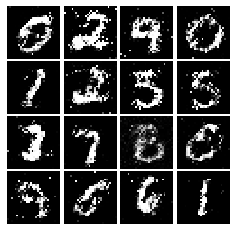

Epoch: 7, Iter: 3740, D: 0.2348, G:0.214


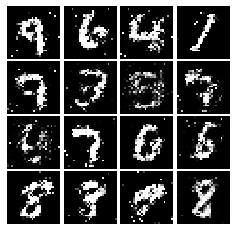

Epoch: 8, Iter: 3760, D: 0.2212, G:0.1656


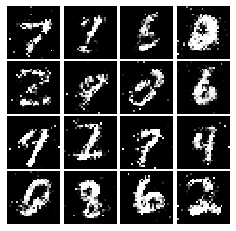

Epoch: 8, Iter: 3780, D: 0.2258, G:0.1459


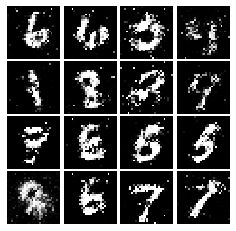

Epoch: 8, Iter: 3800, D: 0.2267, G:0.1857


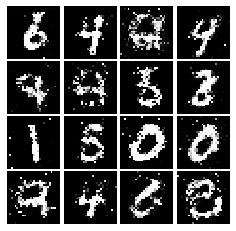

Epoch: 8, Iter: 3820, D: 0.2179, G:0.2073


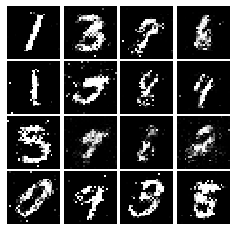

Epoch: 8, Iter: 3840, D: 0.2283, G:0.1749


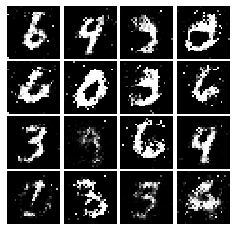

Epoch: 8, Iter: 3860, D: 0.215, G:0.1474


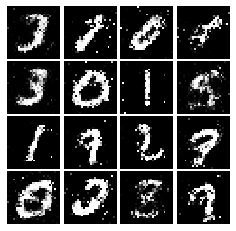

Epoch: 8, Iter: 3880, D: 0.2109, G:0.1862


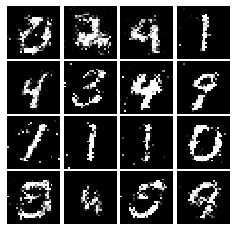

Epoch: 8, Iter: 3900, D: 0.2715, G:0.1451


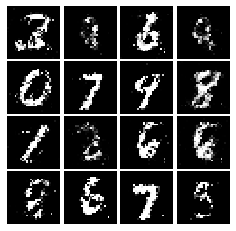

Epoch: 8, Iter: 3920, D: 0.2003, G:0.2107


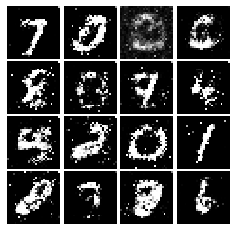

Epoch: 8, Iter: 3940, D: 0.2183, G:0.1582


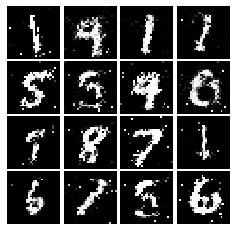

Epoch: 8, Iter: 3960, D: 0.2195, G:0.1823


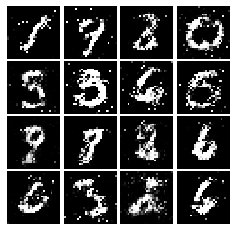

Epoch: 8, Iter: 3980, D: 0.2073, G:0.2187


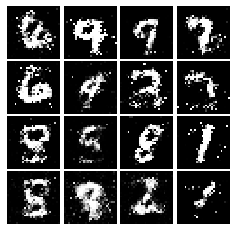

Epoch: 8, Iter: 4000, D: 0.2035, G:0.1847


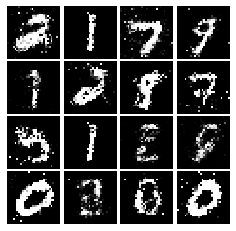

Epoch: 8, Iter: 4020, D: 0.2254, G:0.1732


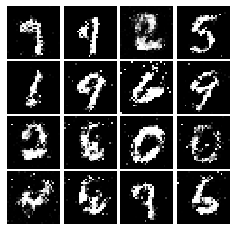

Epoch: 8, Iter: 4040, D: 0.2101, G:0.2069


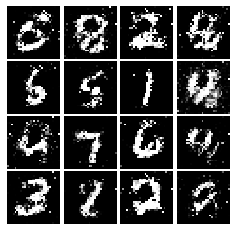

Epoch: 8, Iter: 4060, D: 0.209, G:0.201


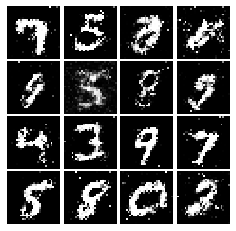

Epoch: 8, Iter: 4080, D: 0.2407, G:0.165


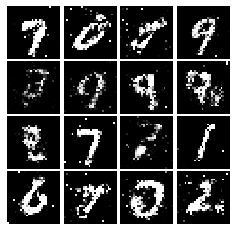

Epoch: 8, Iter: 4100, D: 0.2363, G:0.1612


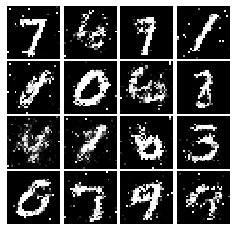

Epoch: 8, Iter: 4120, D: 0.2355, G:0.1616


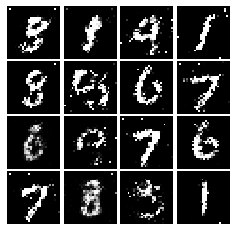

Epoch: 8, Iter: 4140, D: 0.2214, G:0.1967


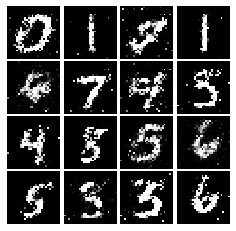

Epoch: 8, Iter: 4160, D: 0.2163, G:0.1769


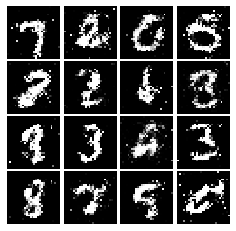

Epoch: 8, Iter: 4180, D: 0.2414, G:0.1498


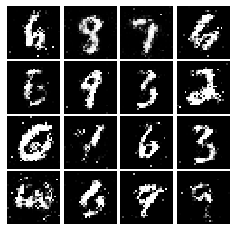

Epoch: 8, Iter: 4200, D: 0.2285, G:0.1849


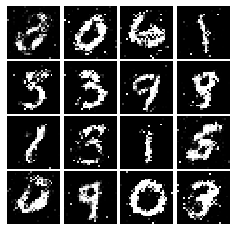

Epoch: 8, Iter: 4220, D: 0.2515, G:0.1681


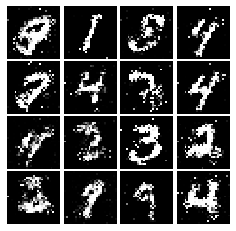

Epoch: 9, Iter: 4240, D: 0.2382, G:0.1608


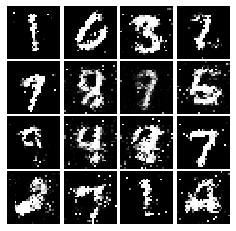

Epoch: 9, Iter: 4260, D: 0.2462, G:0.1522


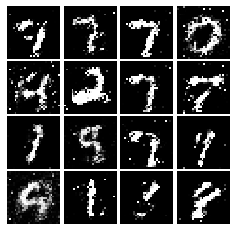

Epoch: 9, Iter: 4280, D: 0.2578, G:0.1765


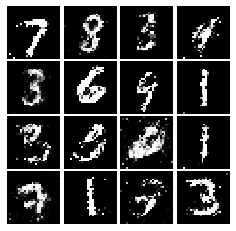

Epoch: 9, Iter: 4300, D: 0.2305, G:0.1657


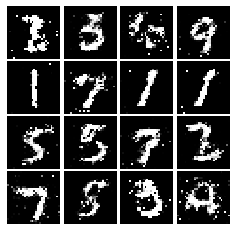

Epoch: 9, Iter: 4320, D: 0.2336, G:0.1387


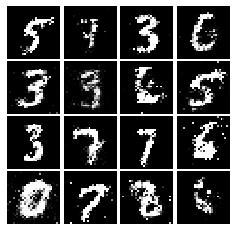

Epoch: 9, Iter: 4340, D: 0.2506, G:0.1685


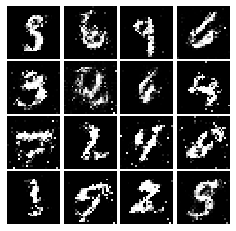

Epoch: 9, Iter: 4360, D: 0.2427, G:0.1823


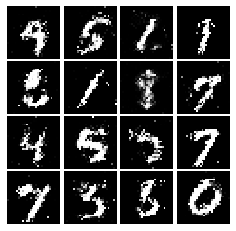

Epoch: 9, Iter: 4380, D: 0.2366, G:0.1732


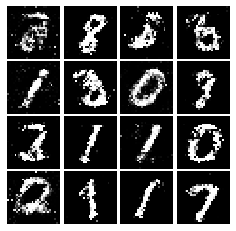

Epoch: 9, Iter: 4400, D: 0.2193, G:0.1727


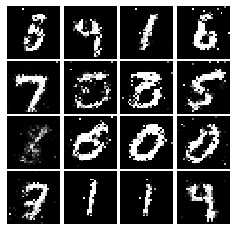

Epoch: 9, Iter: 4420, D: 0.2156, G:0.1708


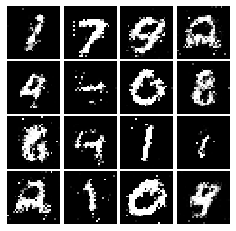

Epoch: 9, Iter: 4440, D: 0.2377, G:0.1531


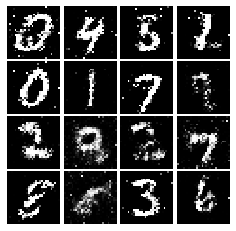

Epoch: 9, Iter: 4460, D: 0.2295, G:0.1611


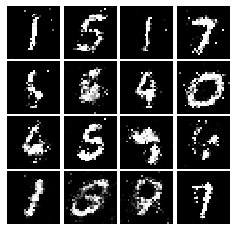

Epoch: 9, Iter: 4480, D: 0.2174, G:0.1885


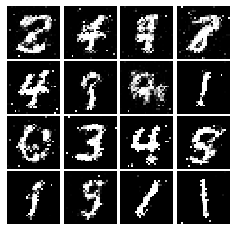

Epoch: 9, Iter: 4500, D: 0.2638, G:0.1725


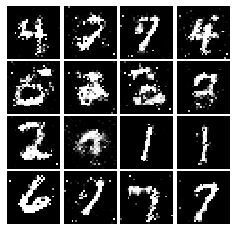

Epoch: 9, Iter: 4520, D: 0.2404, G:0.1685


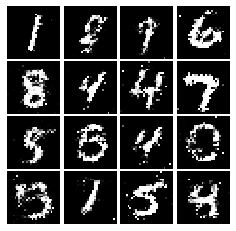

Epoch: 9, Iter: 4540, D: 0.2288, G:0.1665


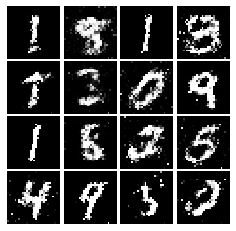

Epoch: 9, Iter: 4560, D: 0.2131, G:0.1804


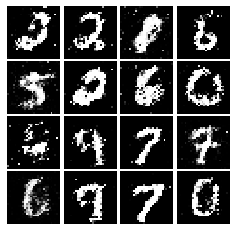

Epoch: 9, Iter: 4580, D: 0.2326, G:0.1894


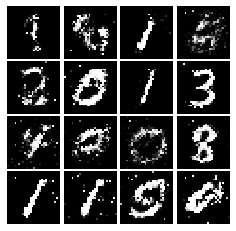

Epoch: 9, Iter: 4600, D: 0.2301, G:0.1669


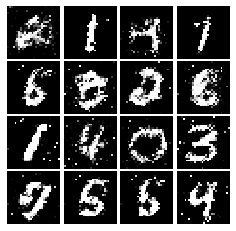

Epoch: 9, Iter: 4620, D: 0.2167, G:0.1966


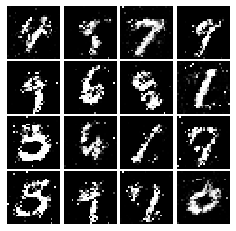

Epoch: 9, Iter: 4640, D: 0.2261, G:0.1477


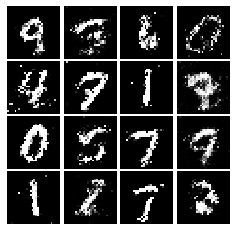

Epoch: 9, Iter: 4660, D: 0.2305, G:0.1588


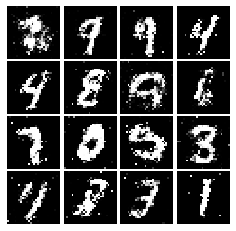

Epoch: 9, Iter: 4680, D: 0.2439, G:0.1729


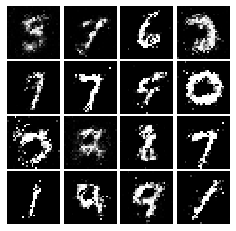

Final images


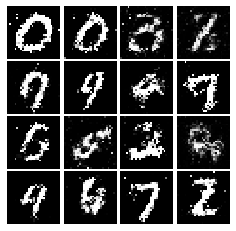

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [0]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
 

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.364, G:0.6689


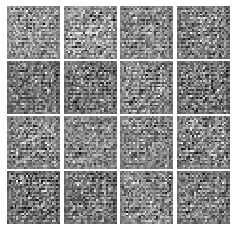

Epoch: 0, Iter: 20, D: 0.6391, G:1.371


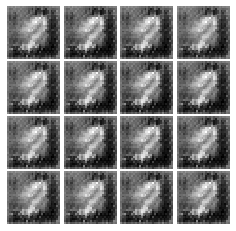

Epoch: 0, Iter: 40, D: 0.7135, G:3.004


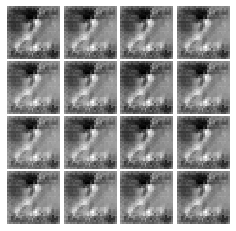

Epoch: 0, Iter: 60, D: 0.6168, G:2.407


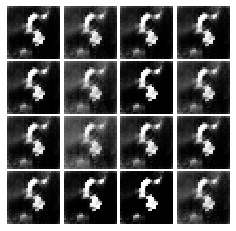

Epoch: 0, Iter: 80, D: 1.665, G:3.984


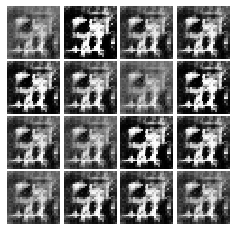

Epoch: 0, Iter: 100, D: 0.4603, G:2.37


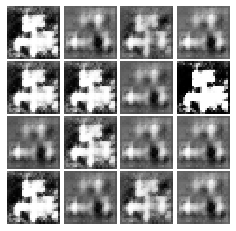

Epoch: 0, Iter: 120, D: 0.8788, G:1.542


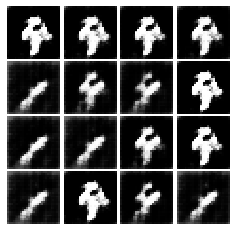

Epoch: 0, Iter: 140, D: 0.2148, G:3.62


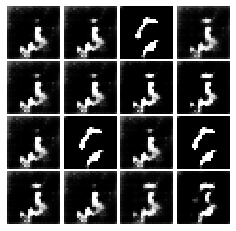

Epoch: 0, Iter: 160, D: 0.9073, G:4.909


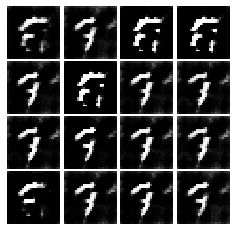

Epoch: 0, Iter: 180, D: 0.4139, G:3.714


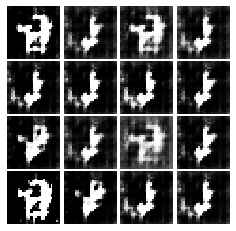

Epoch: 0, Iter: 200, D: 0.1728, G:3.213


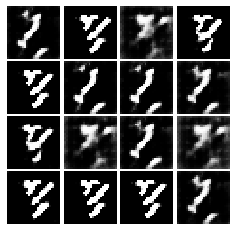

Epoch: 0, Iter: 220, D: 0.3539, G:3.155


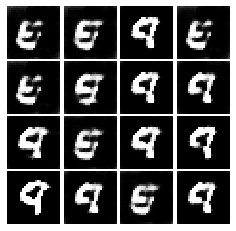

Epoch: 0, Iter: 240, D: 0.6691, G:1.854


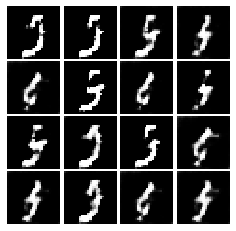

Epoch: 0, Iter: 260, D: 0.7201, G:1.826


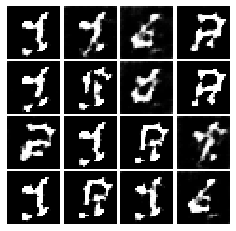

Epoch: 0, Iter: 280, D: 0.5344, G:2.692


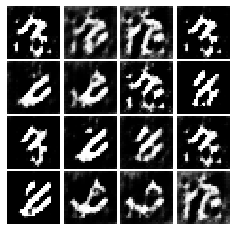

Epoch: 0, Iter: 300, D: 0.5646, G:3.774


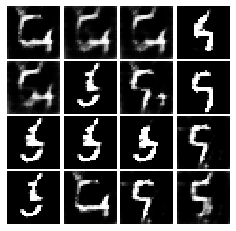

Epoch: 0, Iter: 320, D: 0.695, G:1.77


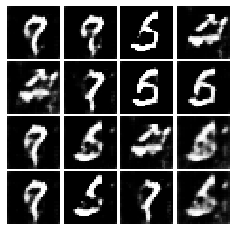

Epoch: 0, Iter: 340, D: 0.6194, G:1.403


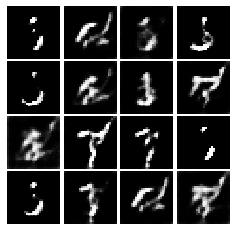

Epoch: 0, Iter: 360, D: 0.5748, G:3.877


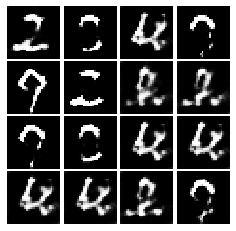

Epoch: 0, Iter: 380, D: 0.4257, G:2.641


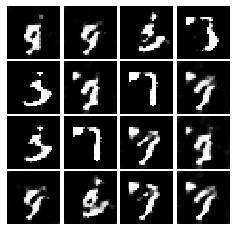

Epoch: 0, Iter: 400, D: 0.4113, G:2.492


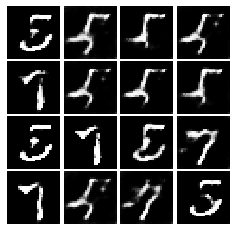

Epoch: 0, Iter: 420, D: 0.4579, G:2.993


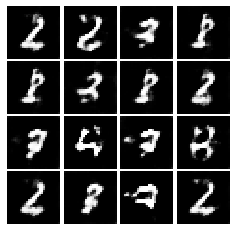

Epoch: 0, Iter: 440, D: 0.4506, G:2.773


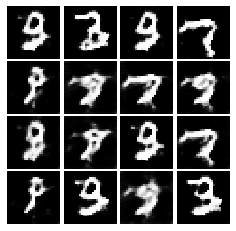

Epoch: 0, Iter: 460, D: 0.9468, G:2.059


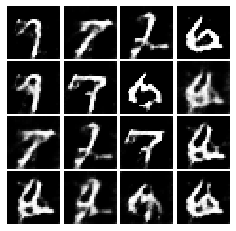

Epoch: 1, Iter: 480, D: 0.8843, G:1.434


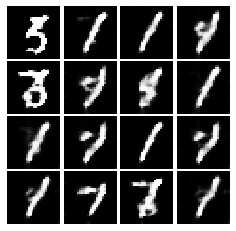

Epoch: 1, Iter: 500, D: 0.4594, G:1.389


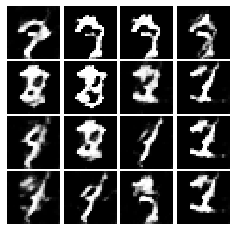

Epoch: 1, Iter: 520, D: 0.9449, G:4.003


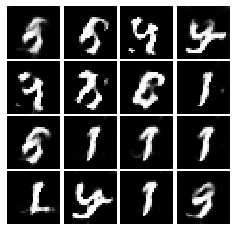

Epoch: 1, Iter: 540, D: 0.6946, G:0.7518


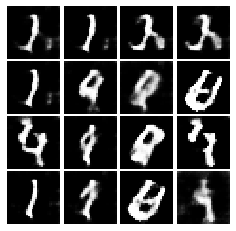

Epoch: 1, Iter: 560, D: 0.5899, G:1.866


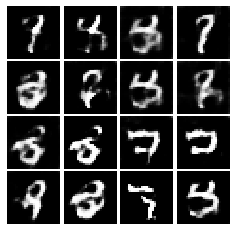

Epoch: 1, Iter: 580, D: 0.3907, G:2.659


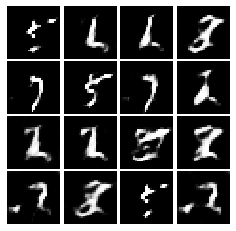

Epoch: 1, Iter: 600, D: 0.6477, G:1.841


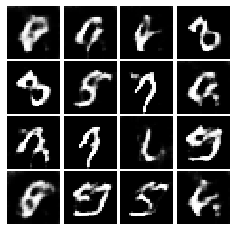

Epoch: 1, Iter: 620, D: 0.9151, G:1.103


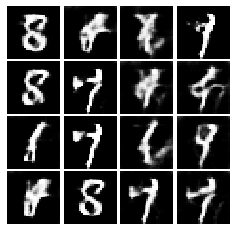

Epoch: 1, Iter: 640, D: 0.5519, G:2.615


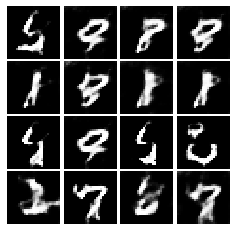

Epoch: 1, Iter: 660, D: 0.79, G:1.571


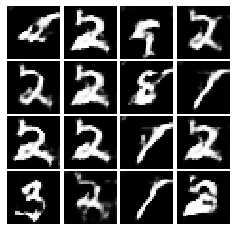

Epoch: 1, Iter: 680, D: 0.5844, G:3.342


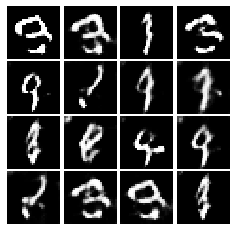

Epoch: 1, Iter: 700, D: 0.4867, G:2.282


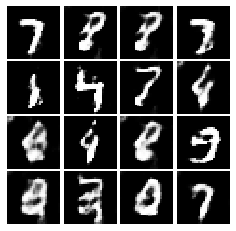

Epoch: 1, Iter: 720, D: 0.6105, G:2.796


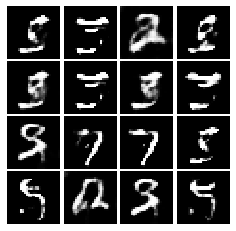

Epoch: 1, Iter: 740, D: 0.7781, G:0.7484


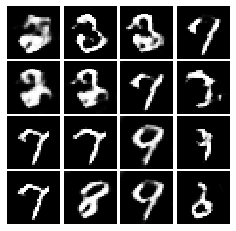

Epoch: 1, Iter: 760, D: 0.7104, G:2.991


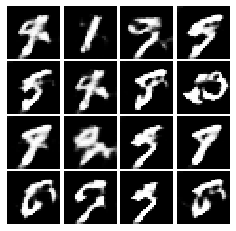

Epoch: 1, Iter: 780, D: 0.7472, G:1.583


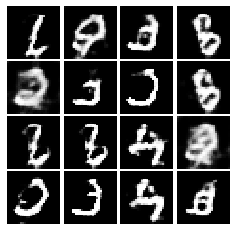

Epoch: 1, Iter: 800, D: 0.6106, G:2.641


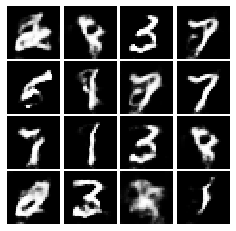

Epoch: 1, Iter: 820, D: 0.6573, G:2.093


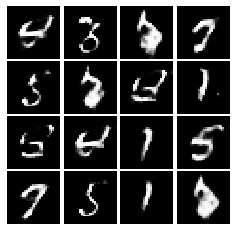

Epoch: 1, Iter: 840, D: 0.461, G:2.714


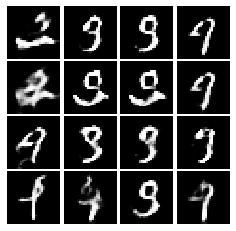

Epoch: 1, Iter: 860, D: 0.7022, G:3.171


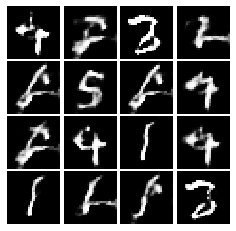

Epoch: 1, Iter: 880, D: 0.5449, G:2.162


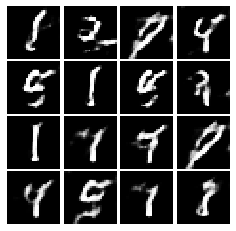

Epoch: 1, Iter: 900, D: 0.6492, G:2.142


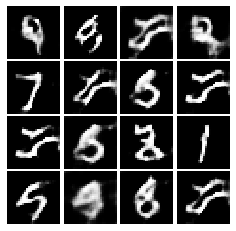

Epoch: 1, Iter: 920, D: 0.8781, G:1.912


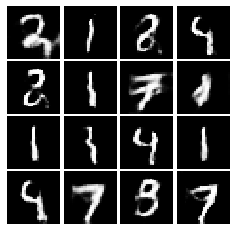

Epoch: 2, Iter: 940, D: 0.7476, G:2.273


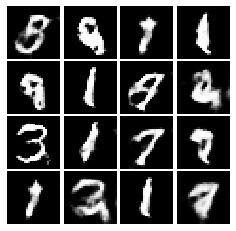

Epoch: 2, Iter: 960, D: 1.021, G:1.624


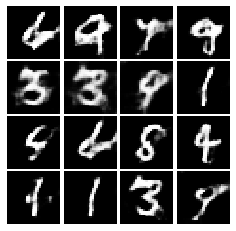

Epoch: 2, Iter: 980, D: 0.6344, G:2.19


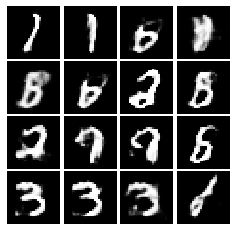

Epoch: 2, Iter: 1000, D: 1.035, G:1.839


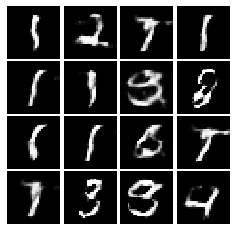

Epoch: 2, Iter: 1020, D: 0.9026, G:1.319


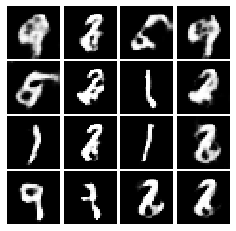

Epoch: 2, Iter: 1040, D: 0.7693, G:1.962


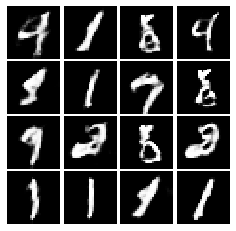

Epoch: 2, Iter: 1060, D: 0.6709, G:1.71


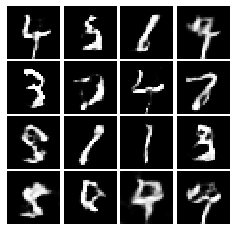

Epoch: 2, Iter: 1080, D: 0.7528, G:2.266


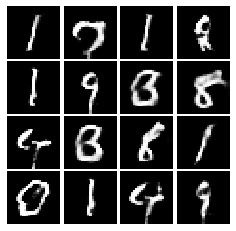

Epoch: 2, Iter: 1100, D: 0.8348, G:2.347


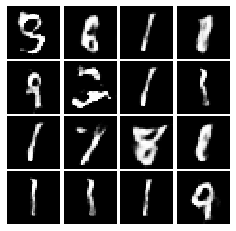

Epoch: 2, Iter: 1120, D: 0.7391, G:2.028


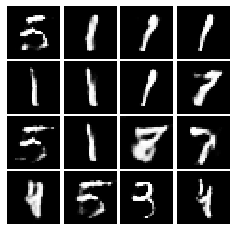

Epoch: 2, Iter: 1140, D: 0.7001, G:2.456


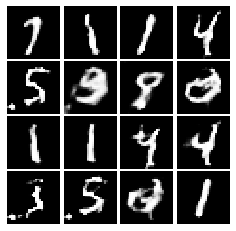

Epoch: 2, Iter: 1160, D: 1.106, G:1.673


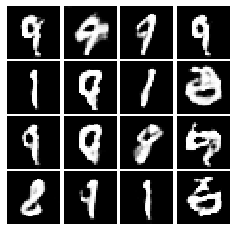

Epoch: 2, Iter: 1180, D: 0.7056, G:1.671


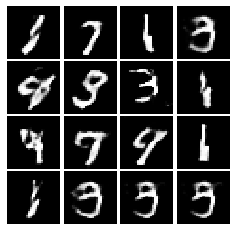

Epoch: 2, Iter: 1200, D: 0.65, G:1.693


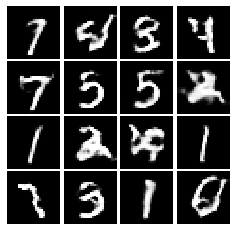

Epoch: 2, Iter: 1220, D: 0.7993, G:1.13


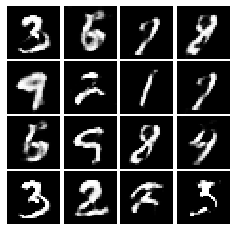

Epoch: 2, Iter: 1240, D: 0.6826, G:1.506


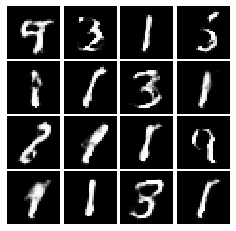

Epoch: 2, Iter: 1260, D: 0.6721, G:1.541


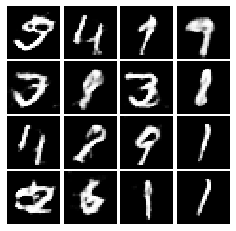

Epoch: 2, Iter: 1280, D: 0.915, G:2.039


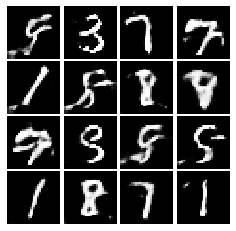

Epoch: 2, Iter: 1300, D: 0.6971, G:1.768


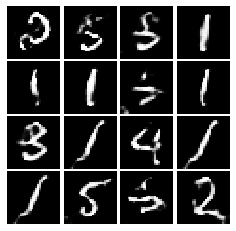

Epoch: 2, Iter: 1320, D: 0.7585, G:1.536


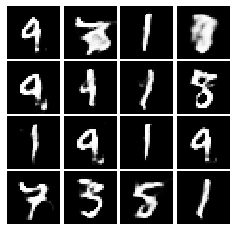

Epoch: 2, Iter: 1340, D: 0.6786, G:1.898


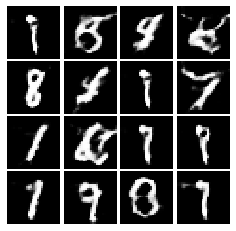

Epoch: 2, Iter: 1360, D: 0.6099, G:1.741


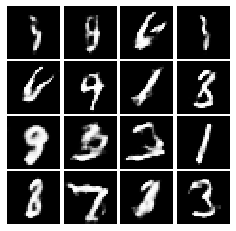

Epoch: 2, Iter: 1380, D: 0.6399, G:1.902


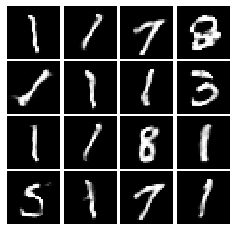

Epoch: 2, Iter: 1400, D: 0.7332, G:1.049


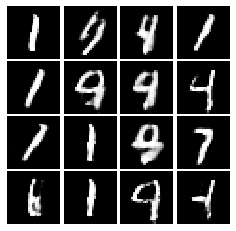

Epoch: 3, Iter: 1420, D: 0.7532, G:1.818


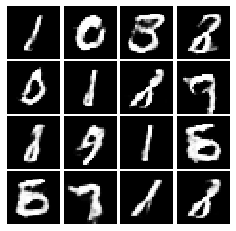

Epoch: 3, Iter: 1440, D: 0.756, G:1.819


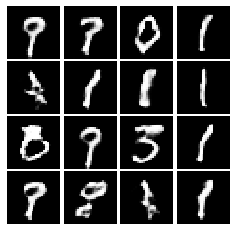

Epoch: 3, Iter: 1460, D: 0.8507, G:1.372


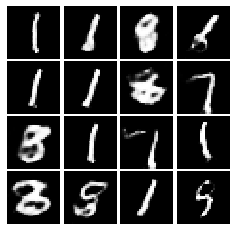

Epoch: 3, Iter: 1480, D: 0.6956, G:1.998


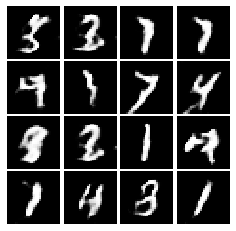

Epoch: 3, Iter: 1500, D: 0.6493, G:1.678


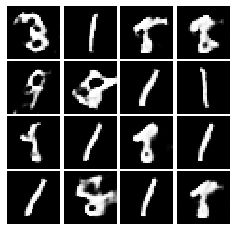

Epoch: 3, Iter: 1520, D: 0.5533, G:2.103


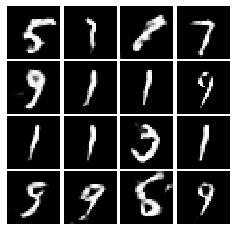

Epoch: 3, Iter: 1540, D: 0.795, G:1.494


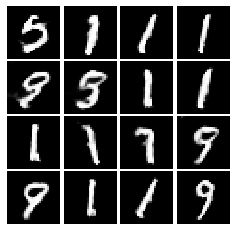

Epoch: 3, Iter: 1560, D: 0.8513, G:1.528


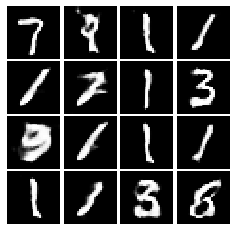

Epoch: 3, Iter: 1580, D: 0.7848, G:1.27


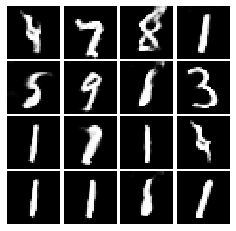

Epoch: 3, Iter: 1600, D: 0.8603, G:1.73


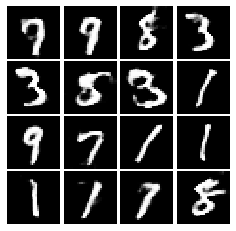

Epoch: 3, Iter: 1620, D: 0.6549, G:2.568


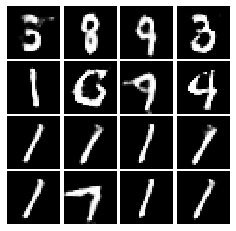

Epoch: 3, Iter: 1640, D: 0.6291, G:1.729


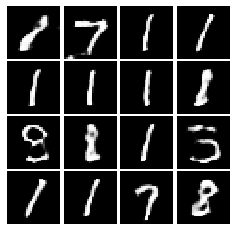

Epoch: 3, Iter: 1660, D: 0.6051, G:2.173


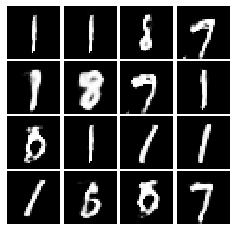

Epoch: 3, Iter: 1680, D: 0.7219, G:1.952


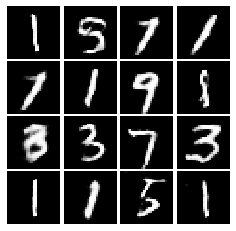

Epoch: 3, Iter: 1700, D: 0.7032, G:2.171


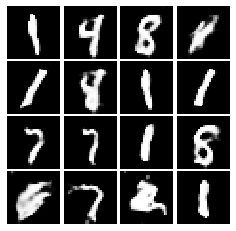

Epoch: 3, Iter: 1720, D: 0.721, G:1.602


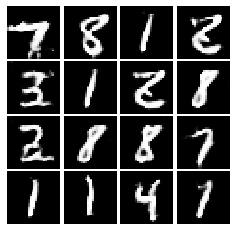

Epoch: 3, Iter: 1740, D: 0.7797, G:1.238


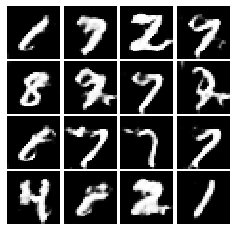

Epoch: 3, Iter: 1760, D: 0.7305, G:2.18


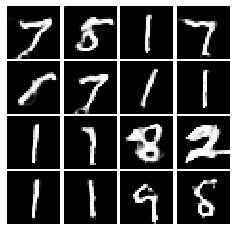

Epoch: 3, Iter: 1780, D: 0.6163, G:1.863


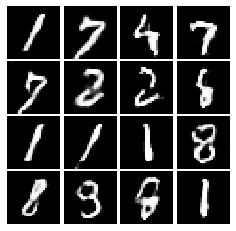

Epoch: 3, Iter: 1800, D: 0.6926, G:1.725


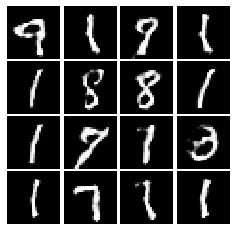

Epoch: 3, Iter: 1820, D: 0.7342, G:1.597


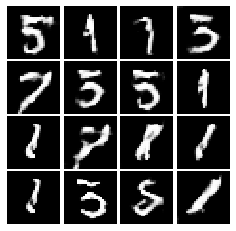

Epoch: 3, Iter: 1840, D: 0.766, G:1.526


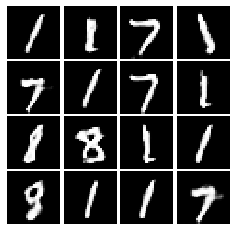

Epoch: 3, Iter: 1860, D: 0.6745, G:1.741


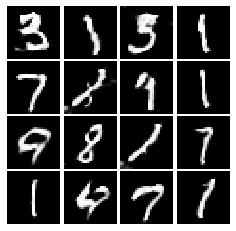

Epoch: 4, Iter: 1880, D: 0.692, G:1.865


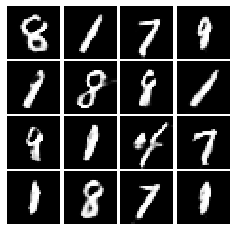

Epoch: 4, Iter: 1900, D: 0.6006, G:2.149


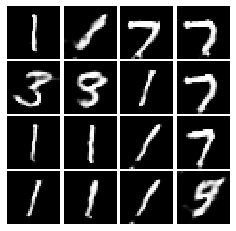

Epoch: 4, Iter: 1920, D: 0.6591, G:1.966


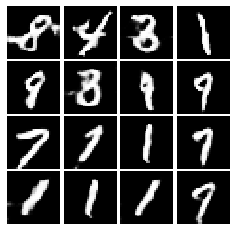

Epoch: 4, Iter: 1940, D: 0.4912, G:2.218


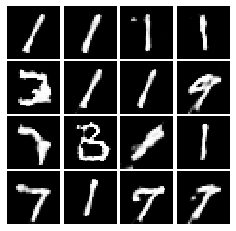

Epoch: 4, Iter: 1960, D: 0.5988, G:1.988


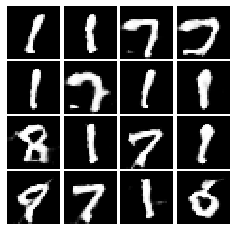

Epoch: 4, Iter: 1980, D: 0.5157, G:2.044


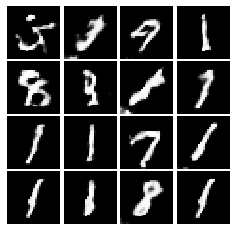

Epoch: 4, Iter: 2000, D: 0.9258, G:1.809


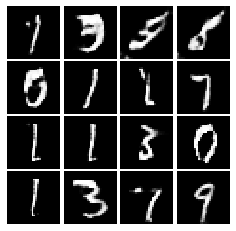

Epoch: 4, Iter: 2020, D: 0.6991, G:1.495


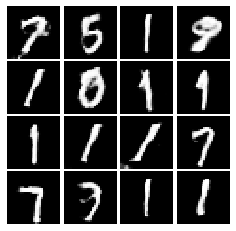

Epoch: 4, Iter: 2040, D: 0.6903, G:2.02


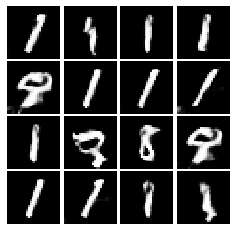

Epoch: 4, Iter: 2060, D: 0.4993, G:2.548


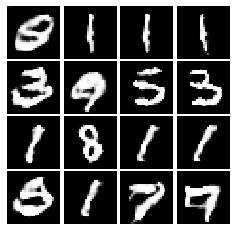

Epoch: 4, Iter: 2080, D: 0.6263, G:2.263


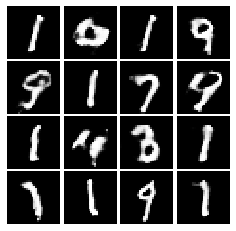

Epoch: 4, Iter: 2100, D: 0.667, G:2.008


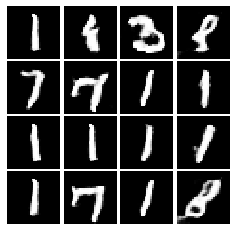

Epoch: 4, Iter: 2120, D: 0.6143, G:2.12


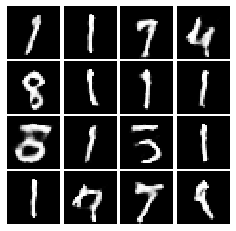

Epoch: 4, Iter: 2140, D: 0.6305, G:2.052


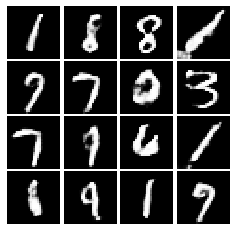

Epoch: 4, Iter: 2160, D: 0.735, G:1.967


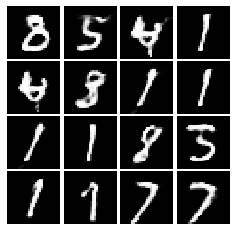

Epoch: 4, Iter: 2180, D: 0.7236, G:2.59


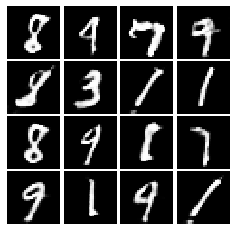

Epoch: 4, Iter: 2200, D: 0.6678, G:1.782


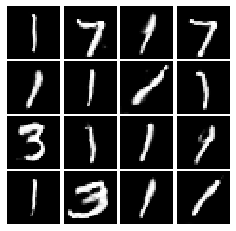

Epoch: 4, Iter: 2220, D: 0.704, G:2.117


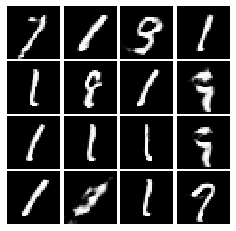

Epoch: 4, Iter: 2240, D: 0.744, G:2.097


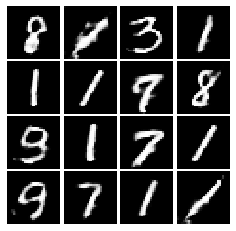

Epoch: 4, Iter: 2260, D: 0.5675, G:2.273


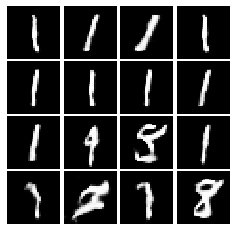

Epoch: 4, Iter: 2280, D: 0.7399, G:2.182


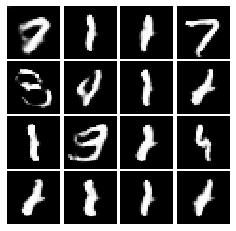

Epoch: 4, Iter: 2300, D: 0.5615, G:1.938


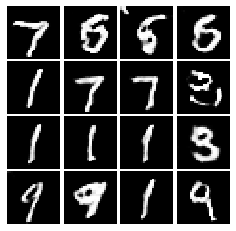

Epoch: 4, Iter: 2320, D: 0.5433, G:1.672


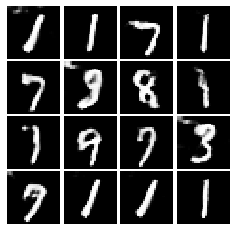

Epoch: 4, Iter: 2340, D: 0.6169, G:2.289


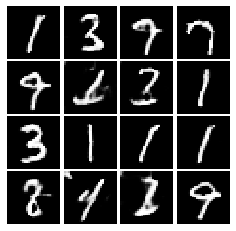

Final images


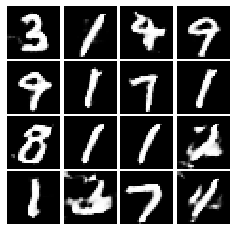

In [0]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |     1  | 0      | 0      |  0     | 0      |  0     
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |      1 |0       |  0     | 0      |  0     | 0      
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 


*Many thanks to Stanford CS231n for permission to use their materials!*